In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import json
import boto3
import sagemaker
from sagemaker import get_execution_role

import pandas as pd
import numpy as np

from sqlalchemy import create_engine, text
from sqlalchemy.orm import sessionmaker

from sagemaker.feature_store.feature_group import FeatureGroup

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)
import os
import io

import psycopg2
import gc

import pandas as pd
import numpy as np

from datetime import datetime

import numpy as np
import seaborn as sns

import matplotlib.pyplot as plt


from lifelines import KaplanMeierFitter
from lifelines import CoxPHFitter, WeibullAFTFitter
from sklearn.pipeline import Pipeline
from lifelines.utils.sklearn_adapter import sklearn_adapter


from sklearn.preprocessing import StandardScaler, Normalizer, StandardScaler, OrdinalEncoder
from sklearn.impute import SimpleImputer
from sagemaker.feature_store.feature_group import FeatureGroup


from sklearn.feature_extraction.text import _VectorizerMixin
from sklearn.feature_selection._base import SelectorMixin
from sklearn import set_config

# import time
# set_config(display='diagram') 


import requests
from requests.auth import HTTPBasicAuth


from sklearn.model_selection import train_test_split

from sklearn.preprocessing import OneHotEncoder, StandardScaler, Normalizer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier

from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, f1_score, precision_recall_fscore_support, roc_curve, precision_recall_curve


%matplotlib inline

In [2]:

df = pd.read_csv('ma_ltv_merged_syn.csv')

In [3]:
# df

In [4]:
df = df[df['application_id'].notna()]


In [5]:
df

,application_id,owner_email,application_name,policy_id,owner_id,owner_phone,parent_application_id,sk_referral_flag,bk_product_type,carrier,lead_id,first_name,last_name,submitted_weekday,submitted_day,submitted_month,submitted_year,area_code,age,age_range,jrn_boberdoo_amount,jrn_boberdoo_source,jrn_boberdoo_lead_type,jrn_id,jrn_date,jrn_tracking_file_path,jrn_event_date,jrn_firstparty,jrn_tcpa_universal_id,jrn_is_first_party,jrn_error,jrn_url,jrn_year,jrn_month,jrn_day,jrn_hour,jrn_request_f_name,jrn_request_l_name,jrn_request_email,jrn_request_phone1,jrn_request_address1,jrn_request_tcpa_universal_id,jrn_request_provider,jrn_request_age,jrn_request_dob,jrn_request_smoker,jrn_response_audit_authentic,jrn_response_audit_consumer_five_minutes,jrn_response_audit_consumer_hour,jrn_response_audit_consumer_twelve_hours,jrn_response_audit_consumer_twelve_consumer_day,jrn_response_audit_consumer_week,jrn_response_audit_data_integrity,jrn_response_audit_fields_email,jrn_response_audit_fields_f_name,jrn_response_audit_fields_l_name,jrn_response_audit_fields_phone1,jrn_response_audit_fields_address1,jrn_response_audit_device_five_minutes,jrn_response_audit_device_hour,jrn_response_audit_device_twelve_hours,jrn_response_audit_device_day,jrn_response_audit_device_week,jrn_response_audit_consumer_dupe_check,jrn_response_audit_entity_value,jrn_response_audit_ip_five_minutes,jrn_response_audit_ip_hour,jrn_response_audit_ip_twelve_hours,jrn_response_audit_ip_day,jrn_response_audit_ip_week,jrn_response_audit_lead_age,jrn_response_audit_age,jrn_response_audit_lead_duration,jrn_response_audit_duration,jrn_response_audit_lead_dupe_check,jrn_response_audit_lead_dupe,jrn_response_audit_lead_five_minutes,jrn_response_audit_lead_hour,jrn_response_audit_lead_twelve_hours,jrn_response_audit_lead_day,jrn_response_audit_lead_week,jrn_response_audit_market_leadid_tcpa_disclosure,jrn_response_audit_market_leadid_tcpa_prominence,jrn_response_audit_market_leadid_tcpa_contrast,jrn_response_audit_market_leadid_tcpa_visibility,jrn_response_audit_market_leadid_tcpa_stored,jrn_response_audit_market_leadid_tcpa_capture,jrn_response_audit_market_leadid_tcpa_result,jrn_response_audit_market_leadid_result,jrn_response_audit_market_result,jrn_response_audit_url_value,jrn_response_audit_result,jrn_response_audit_token,zcta_latitude,zcta_longitude,zcta_cdc_all_teeth_lost,zcta_cdc_annual_checkup,zcta_cdc_arthritis,zcta_cdc_binge_drinking,zcta_cdc_cancer_except_skin,zcta_cdc_cervical_cancer_screening,zcta_cdc_cholesterol_screening,zcta_cdc_chronic_kidney_disease,zcta_cdc_colorectal_cancer_screening,zcta_cdc_copd,zcta_cdc_core_preventive_services_for_older_men,zcta_cdc_core_preventive_services_for_older_women,zcta_cdc_coronary_heart_disease,zcta_cdc_current_asthma,zcta_cdc_current_smoking,zcta_cdc_dental_visit,zcta_cdc_depression,zcta_cdc_diabetes,zcta_cdc_general_health,zcta_cdc_health_insurance,zcta_cdc_high_blood_pressure,zcta_cdc_high_cholesterol,zcta_cdc_mammography,zcta_cdc_mental_health,zcta_cdc_obesity,zcta_cdc_physical_health,zcta_cdc_physical_inactivity,zcta_cdc_sleep_lt_7_hours,zcta_cdc_stroke,zcta_cdc_taking_bp_medication,zcta_cms_mapd_aetna_mrkt_share,zcta_cms_mapd_bcbs_mrkt_share,zcta_cms_mapd_cigna_mrkt_share,zcta_cms_mapd_humana_mrkt_share,zcta_cms_mapd_kaiser_mrkt_share,zcta_cms_mapd_lis_mrkt_share,zcta_cms_mapd_mrkt_leader,zcta_cms_mapd_other_mrkt_share,zcta_cms_mapd_penetration_2021,zcta_cms_mapd_penetration_2022,zcta_cms_mapd_penetration_pct_change,zcta_cms_mapd_priority_mrkt_share,zcta_cms_mapd_uhc_mrkt_share,zcta_cms_mapd_wellcare_mrkt_share,zcta_nyt_pct_dem,zcta_nyt_pct_gop,zcta_usc_housing_units,zcta_usc_land_area_m2,zcta_usc_median_home_value,zcta_usc_median_household_income,zcta_usc_occupied_housing_units,zcta_usc_pct_20_24,zcta_usc_pct_25_34,zcta_usc_pct_35_44,zcta_usc_pct_45_54,zcta_usc_pct_55_59,zcta_usc_pct_60_64,zcta_usc_pct_65_74,zcta_usc_pct_65_over,zcta_usc_pct_american_indian_alaska_native,zcta_usc_pct_asian,zcta_usc_pct_black,zcta_usc_pct_

In [6]:
df.application_id.notna().sum()

21333

In [7]:
df.policy_id.isna().sum()

2821

In [8]:
df.LTV.isna().sum()

0

In [9]:
(df['LTV']!=0).sum()

17684

In [10]:
df['Zero_LTV'] = (df['policy_id'].notna()).astype(int)

In [11]:
df[['policy_id','LTV','Zero_LTV']]

,policy_id,LTV,Zero_LTV
0,34055980-504-001-000,509.250000,1
1,C4053348601-H5294-011-000,442.500000,1
2,OEC_SFTYX3HC6A1LT,984.245833,1
3,34755918-444-193-000,0.000000,1
4,NaN,0.000000,0
...,...,...,...
21382,NaN,0.000000,0
21383,NaN,0.000000,0
21384,NaN,0.000000,0
21385,NaN,0.000000,0


In [12]:
(df['Zero_LTV']==0).sum()

2821

In [13]:
df.Zero_LTV.value_counts()

1    18512
0     2821
Name: Zero_LTV, dtype: int64

In [14]:
df['LTV_is_Zero'] = np.where(df['LTV']==0, 1, 0)
df['LTV_is_Zero'].value_counts()

0    17684
1     3649
Name: LTV_is_Zero, dtype: int64

In [15]:
df['Non_NA_LTV'] = np.where(df['Zero_LTV']==1, df['LTV'], df['Zero_LTV'])
df['Non_NA_LTV']

0        509.250000
1        442.500000
2        984.245833
3          0.000000
4          0.000000
            ...    
21382      0.000000
21383      0.000000
21384      0.000000
21385      0.000000
21386      0.000000
Name: Non_NA_LTV, Length: 21333, dtype: float64

In [16]:
(df['Non_NA_LTV']==0).sum()

5244

In [17]:
df_pol = df[df['Zero_LTV']!=0]
(df_pol.LTV != 0).sum()

16089

In [19]:
# df['count_percentage']

#### Analysis of Non converted Applications

In [20]:
df_NA_pol = df[df['Zero_LTV']==0]
# df_NA_pol
NApol_ST = df_NA_pol.groupby(by=['state','carrier'])['LTV'].sum()
NApol_ST = NApol_ST.reset_index()
# state_carrier.head()
# NApol_ST
NApol_ST_describe = df_NA_pol.groupby(by=['state','carrier'])['LTV'].describe()
NApol_ST_describe = NApol_ST_describe.reset_index()
# NApol_ST_describe.head(5)
NApol_ST = pd.merge(NApol_ST, NApol_ST_describe, on=['state', 'carrier'])
NApol_ST.head()

,state,carrier,LTV,count,mean,std,min,25%,50%,75%,max
0,AL,O65 - Aetna,2700.429167,13.0,207.725321,200.488257,0.0,0.000000,353.488333,386.127500,400.907500
1,AL,O65 - Centene Corporation,589.100250,3.0,196.366750,340.117188,0.0,0.000000,0.000000,294.550125,589.100250
2,AL,O65 - Cigna,2575.316667,7.0,367.902381,367.409521,0.0,0.000000,371.813333,723.890000,755.723333
3,AL,O65 - Humana,7422.962500,22.0,337.407386,266.454648,0.0,87.591042,387.882083,411.220000,966.629167
4,AL,O65 - United Health Care,3471.743333,10.0,347.174333,401.953652,0.0,0.000000,219.236667,645.085417,942.237500


In [130]:
Data.head()

,state,carrier,LTV,LTV_is_Zero,count,mean,std,min,25%,50%,75%,max,percentage_of_conversion
0,AL,O65 - Aetna,26912.242500,10,77.0,349.509643,179.224025,0.0,350.409167,363.957500,394.133333,1030.987500,0.870130
1,AL,O65 - Centene Corporation,8660.038083,5,23.0,376.523395,250.611305,0.0,348.634187,402.718250,422.410396,895.712792,0.782609
2,AL,O65 - Cigna,30844.593333,6,55.0,560.810788,273.521907,0.0,367.993333,721.980000,741.080000,1039.183333,0.890909
3,AL,O65 - Humana,56481.912500,31,133.0,424.676034,326.139566,0.0,350.364167,398.221667,430.126667,1022.595833,0.766917
4,AL,O65 - United Health Care,97655.259167,24,186.0,525.028275,264.176234,0.0,436.625833,455.408750,720.678958,1027.733333,0.870968


In [131]:
# NApol_ST = pd.merge(NApol_ST,Data[['state','carrier','count']] , on=['state', 'carrier'])

In [ ]:
# NApol_ST

In [132]:
# NApol_ST['App_to_Policy_ratio'] = ( NApol_ST['count_y'] - NApol_ST['count_x'] ) / NApol_ST['count_y']

In [ ]:
# Data[['state','count','LTV','LTV_is_Zero']].groupby(['state']).sum()


In [26]:
NApol_ST.head()

,state,carrier,LTV,count,mean,std,min,25%,50%,75%,max
0,AL,O65 - Aetna,2700.429167,13.0,207.725321,200.488257,0.0,0.000000,353.488333,386.127500,400.907500
1,AL,O65 - Centene Corporation,589.100250,3.0,196.366750,340.117188,0.0,0.000000,0.000000,294.550125,589.100250
2,AL,O65 - Cigna,2575.316667,7.0,367.902381,367.409521,0.0,0.000000,371.813333,723.890000,755.723333
3,AL,O65 - Humana,7422.962500,22.0,337.407386,266.454648,0.0,87.591042,387.882083,411.220000,966.629167
4,AL,O65 - United Health Care,3471.743333,10.0,347.174333,401.953652,0.0,0.000000,219.236667,645.085417,942.237500


In [27]:
# NApol_ST.groupby(by='state')['counts'].value_counts()
NApol_ST[['state','count','LTV']].groupby(['state']).sum()
# .sort_values(by='LTV', ascending=False)

# NApol_ST.groupby(['state', 'count']).sum()

,count,LTV
state,,
AL,58.0,17232.051917
AR,61.0,25108.016833
AZ,82.0,28934.546750
CA,130.0,71717.099250
CO,16.0,5295.408333
DE,4.0,1694.980833
FL,293.0,89051.301208
GA,195.0,51518.338333
HI,1.0,0.000000


In [29]:
# NApol_ST.groupby(by=['carrier','state'])['count_x','count_y','App_to_Policy_ratio'].sum()

##### LTV descrption if converted to policy(FOR Policy ID =NA):
LTV                                            990914.373667\
count                                                 2820.0\
mean                                             71723.07799\
std                                             49073.951778\
min                                             21750.570375\
25%                                             32125.368865\
50%                                             72953.756812\
75%                                            102610.520396\
max                                            142182.688208

In [ ]:
# df1 = NApol_ST[NApol_ST['carrier']=='O65 - Humana'][['state','count']]
# df1
# df_NA_pol.state.value_counts()

In [ ]:
# for c in df_NA_pol.carrier.unique():
#     print(NApol_ST[NApol_ST['carrier']==c][['state','count']].count)

In [133]:
NApol_ST[['state','App_to_Policy_ratio']].groupby(['state']).mean().sort_values(by='App_to_Policy_ratio',ascending=False)

,App_to_Policy_ratio
state,
ID,0.909091
UT,0.889359
TN,0.888563
KY,0.887700
MD,0.885417
AL,0.883290
SC,0.877628
WI,0.874603
NM,0.873836


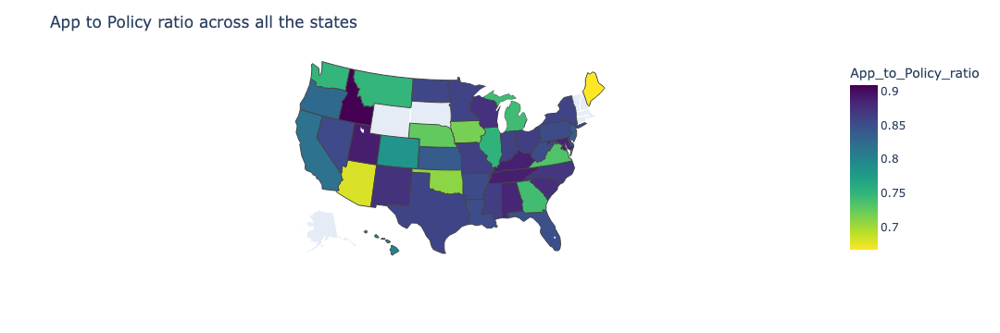

In [134]:

import plotly.express as px
fig = px.choropleth(NApol_ST[['state','count_x','LTV','App_to_Policy_ratio']].groupby(['state']).mean(),
                    locations=NApol_ST[['state','count_x','LTV']].groupby(['state']).mean().index, 
                    locationmode="USA-states", 
                    scope="usa",
                    color='App_to_Policy_ratio',
                    color_continuous_scale="Viridis_r", 
                    # range_color=[NApol_ST['App_to_Policy_ratio'].min(),NApol_ST['App_to_Policy_ratio'].max()],
                    hover_data=['App_to_Policy_ratio'],
                    width = 50,
                    )
fig.update_layout(title_text = 'App to Policy ratio across all the states',geo_scope='usa')

fig.show()

Application to policy ratio rates for different carriers:


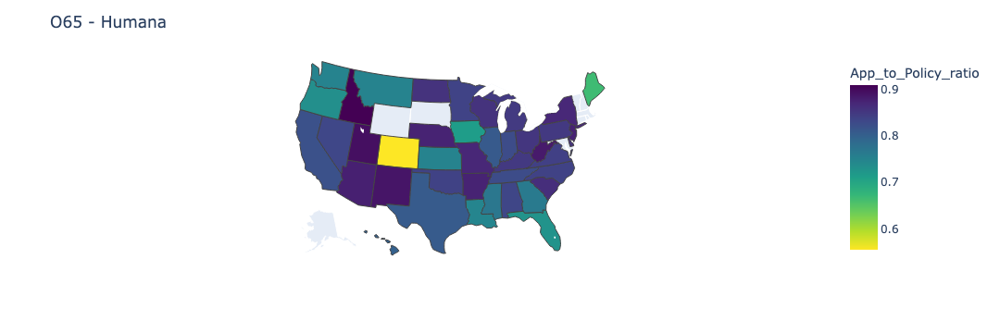

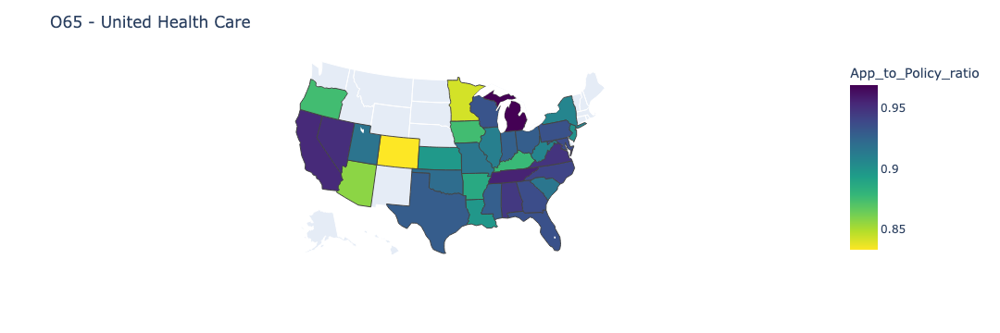

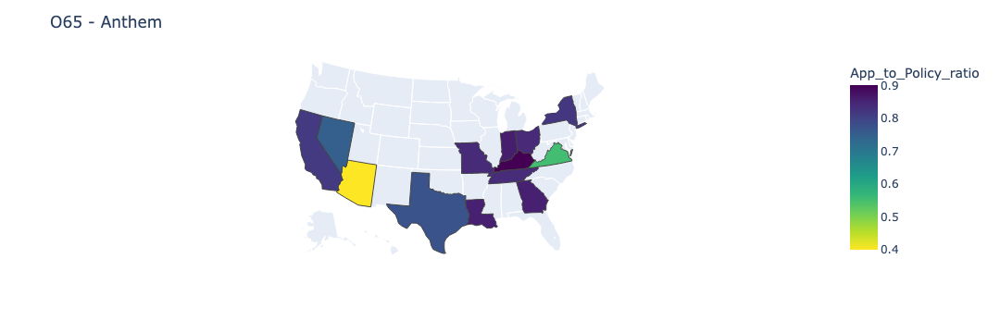

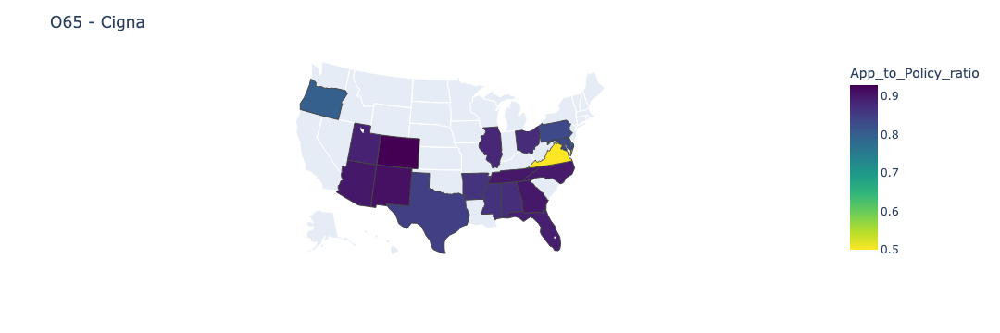

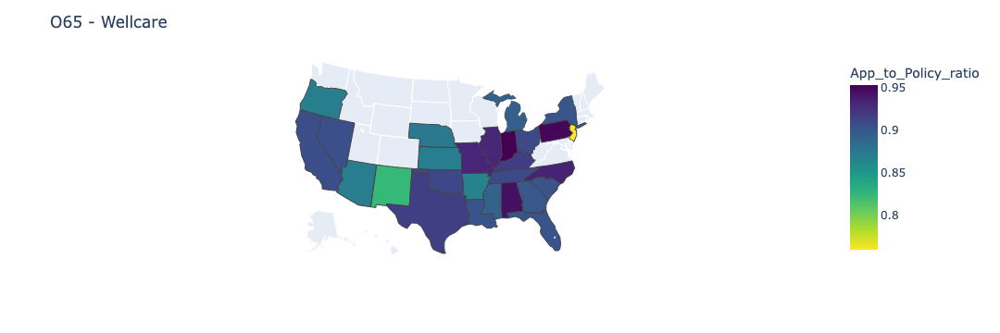

...

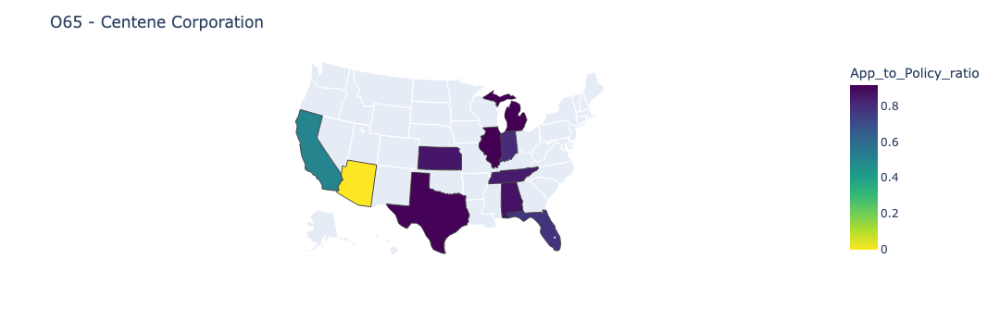

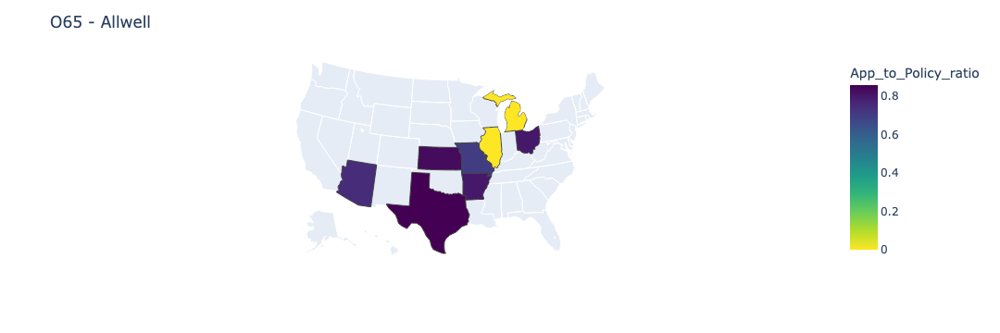

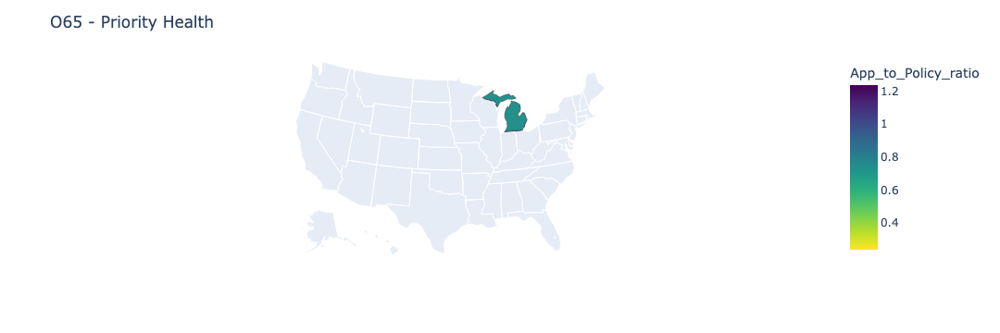

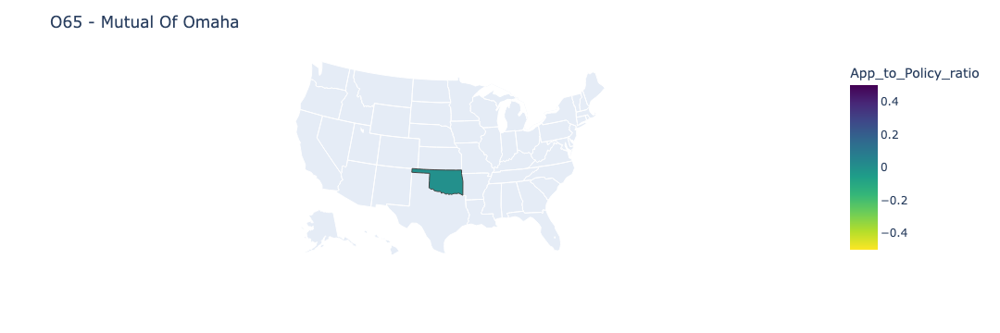

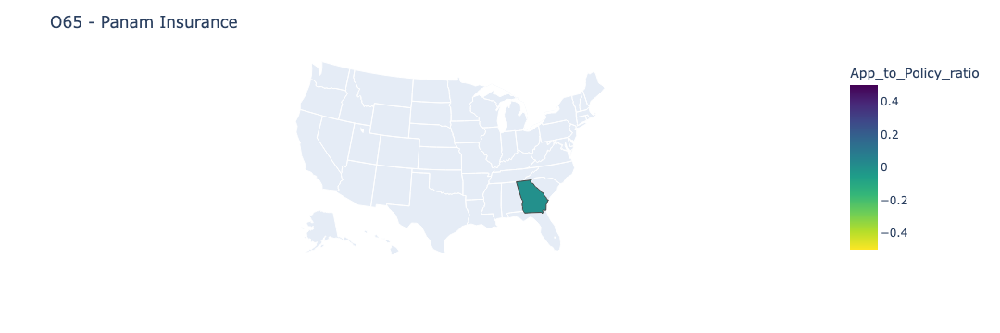

In [135]:
print("Application to policy ratio rates for different carriers:")
for c in df_NA_pol.carrier.unique():
    # print(NApol_ST[NApol_ST['carrier']==c][['state','count']])
    fig = px.choropleth(NApol_ST[NApol_ST['carrier']==c][['state','App_to_Policy_ratio','count_x','count_y']],
                    locations='state', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='App_to_Policy_ratio',
                    color_continuous_scale="Viridis_r", 
                    # range_color=[0,185],
                    hover_data=['App_to_Policy_ratio','count_x','count_y'],
                    width = 50,
                    )
    fig.update_layout(title_text = c,geo_scope='usa')
    fig.show()

In [35]:
# NApol_ST[['state','carrier','count']].groupby(by=['carrier','state']).sum()


In [36]:
# NApol_ST[['state','carrier','count']].groupby(by=['state','carrier']).sum()
# .nlargest(10,columns='LTV')


In [37]:

# (df_NA_pol.LTV == 0).sum()

In [38]:
# NApol_ST['count'].min()

In [39]:
# NApol_ST[['state','carrier','count']].groupby(by=['state','carrier']).sum()

In [40]:
# import plotly.express as px
# fig = px.choropleth(NApol_ST,
#                     locations=NApol_ST.state, 
#                     locationmode="USA-states", 
#                     scope="usa",
#                     color='count',
#                     color_continuous_scale="Viridis_r", 
#                     hover_data=['LTV','count','mean','std','min','max','carrier'],
#                     width = 50
#                     )
# fig.show()

#### Todo
##### Get the the carriers with max zero LTV
##### Get states with max zero LTV
##### Get carriers with max LTV
##### Get states with max LTV
##### get states with max count and ratio of zero LTV
##### Get states with LTV and count for different carriers 

##### Analysis of Zeero LTVs


In [41]:
df_Zero_LTV = df[df['LTV']==0]

Zero_LTV = df_Zero_LTV.groupby(by=['state','carrier'])['LTV'].sum()
Zero_LTV = Zero_LTV.reset_index()
# state_carrier.head()
# NApol_ST
Zero_LTV_describe = df_Zero_LTV.groupby(by=['state','carrier'])['LTV'].describe()
Zero_LTV_describe = Zero_LTV_describe.reset_index()
# NApol_ST_describe.head(5)
Zero_LTV = pd.merge(Zero_LTV, Zero_LTV_describe, on=['state', 'carrier'])
Zero_LTV.head()

,state,carrier,LTV,count,mean,std,min,25%,50%,75%,max
0,AL,O65 - Aetna,0.0,10.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,AL,O65 - Centene Corporation,0.0,5.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,AL,O65 - Cigna,0.0,6.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,AL,O65 - Humana,0.0,31.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,AL,O65 - United Health Care,0.0,24.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [42]:
Zero_LTV[['state','count','LTV']].groupby(['state']).sum().sort_values('count',ascending=False)


,count,LTV
state,,
TX,352.0,0.0
FL,344.0,0.0
GA,224.0,0.0
NC,217.0,0.0
NY,209.0,0.0
TN,177.0,0.0
MI,174.0,0.0
OH,163.0,0.0
IL,162.0,0.0


In [43]:
(Zero_LTV[['state','count','carrier']].groupby(['carrier']).sum())


,count
carrier,
O65 - Aetna,340.0
O65 - Allwell,11.0
O65 - Anthem,126.0
O65 - Centene Corporation,52.0
O65 - Cigna,66.0
O65 - Humana,1396.0
O65 - Mutual Of Omaha,1.0
O65 - Panam Insurance,1.0
O65 - Priority Health,6.0


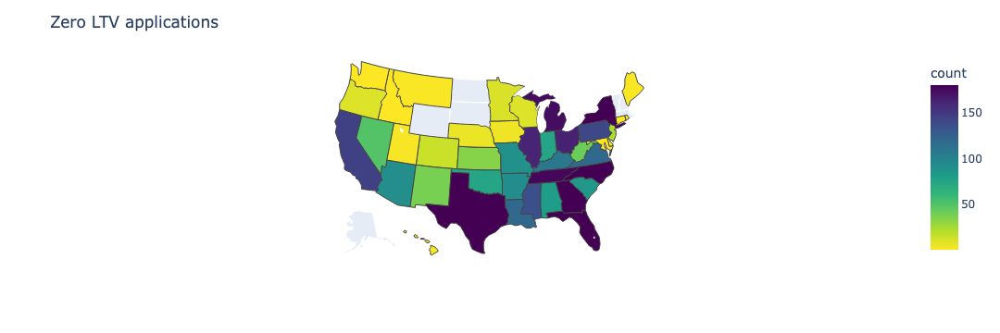

In [44]:

import plotly.express as px
fig = px.choropleth(Zero_LTV[['state','count','LTV']].groupby(['state']).sum(),
                    locations=Zero_LTV[['state','count','LTV']].groupby(['state']).sum().index, 
                    locationmode="USA-states", 
                    scope="usa",
                    color='count',
                    color_continuous_scale="Viridis_r", 
                    range_color=[NApol_ST['count'].min(),NApol_ST['count'].max()],
                    hover_data=['LTV','count'],
                    width = 50,
                    )
fig.update_layout(title_text = 'Zero LTV applications',geo_scope='usa')
fig.show()

No. of Zero LTV applications across states according to Carriers


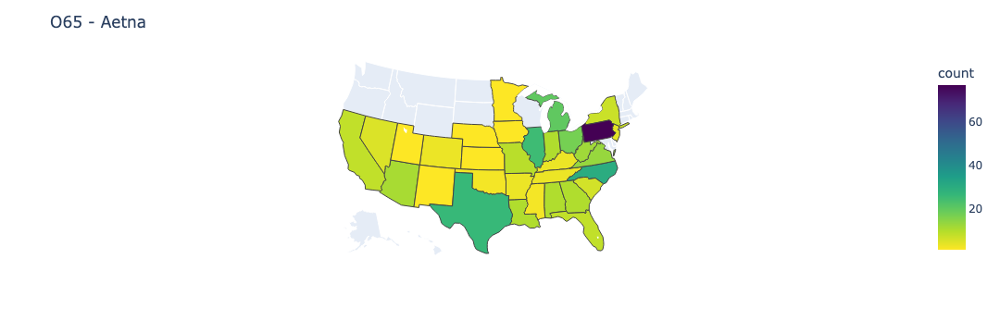

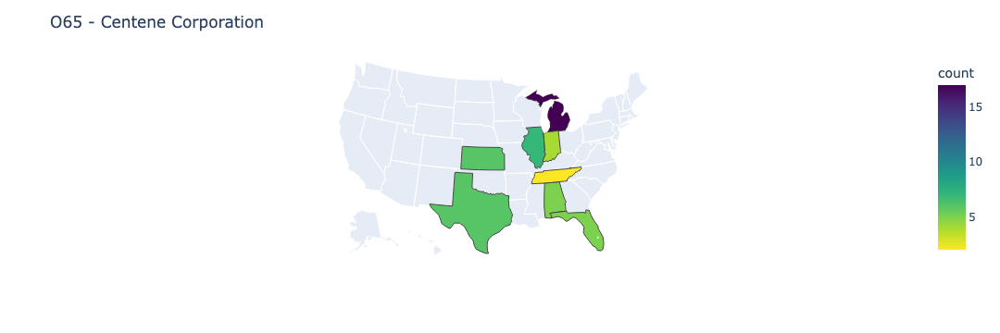

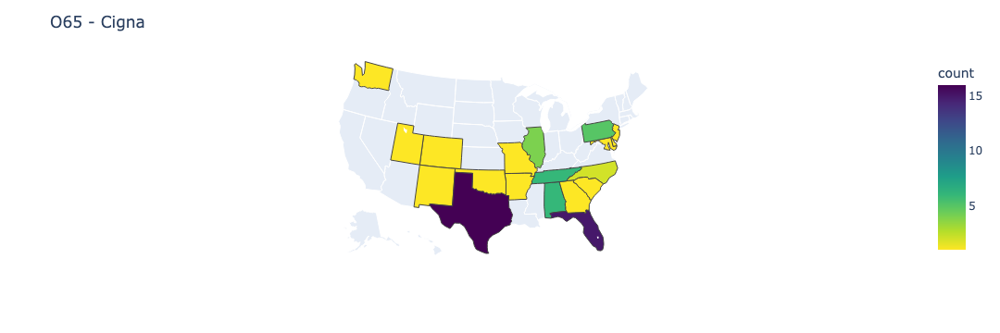

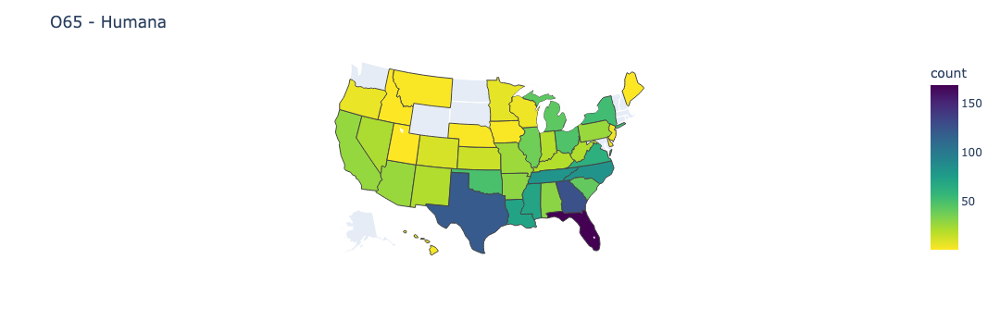

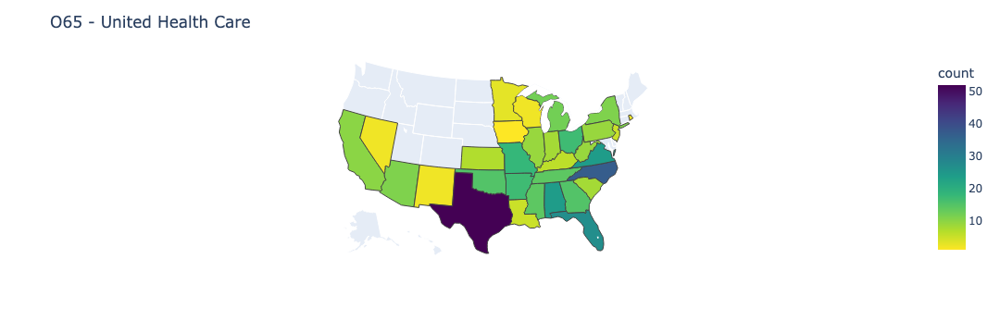

...

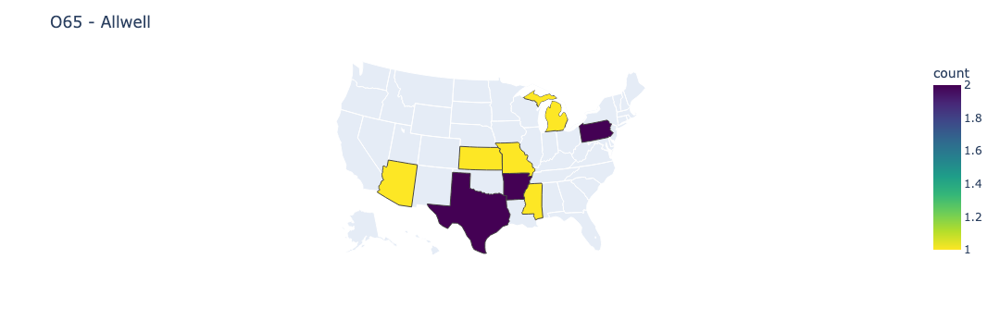

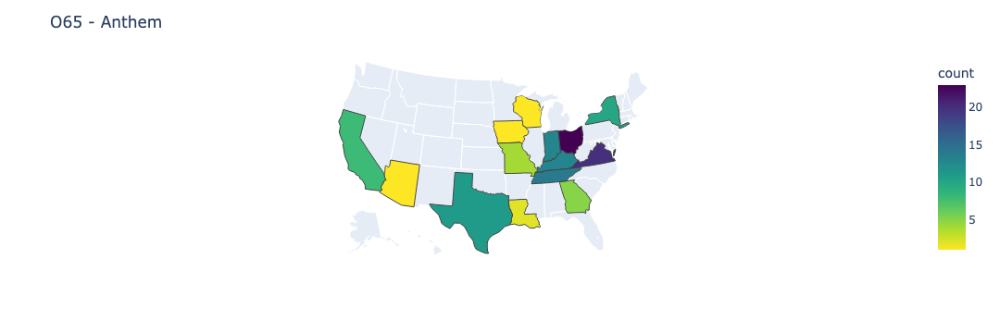

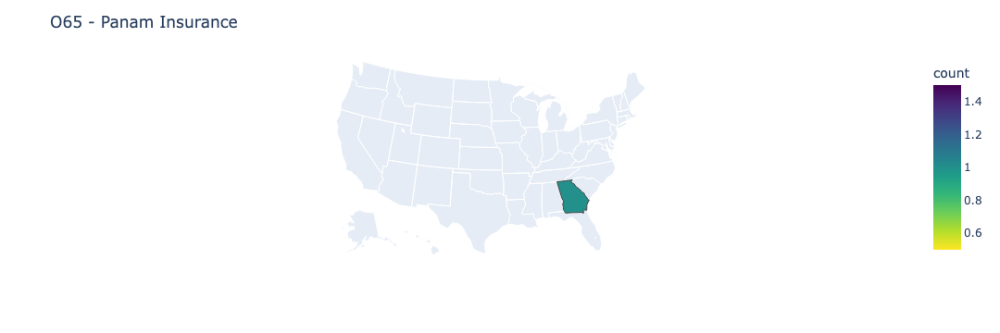

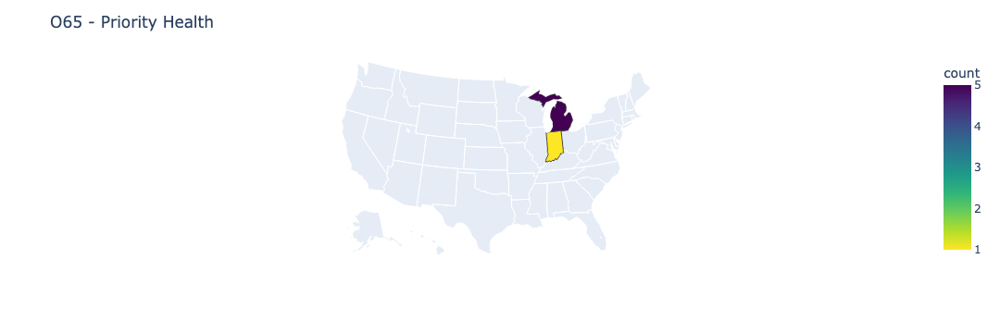

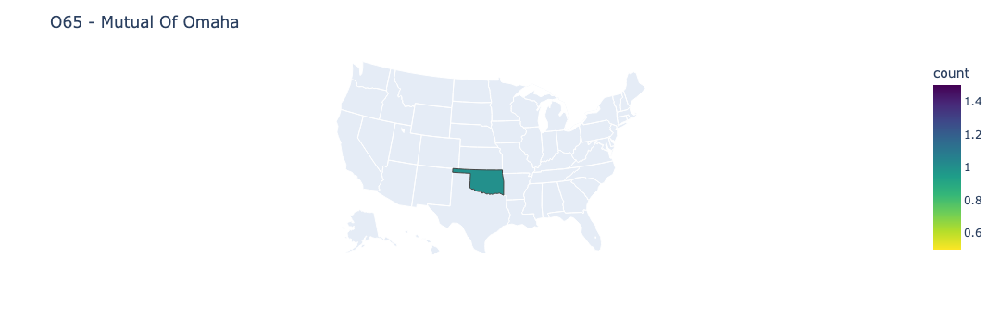

In [45]:
print("No. of Zero LTV applications across states according to Carriers")
for c in Zero_LTV.carrier.unique():
    # print(NApol_ST[NApol_ST['carrier']==c][['state','count']])
    fig = px.choropleth(Zero_LTV[Zero_LTV['carrier']==c][['state','count','LTV']],
                    locations='state', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='count',
                    color_continuous_scale="Viridis_r", 
                    # range_color=[0,185],
                    hover_data=['count'],
                    width = 50,
                    )
    fig.update_layout(title_text = c,geo_scope='usa')
    fig.show()

#### EDA for complete data

In [46]:
Data = df.groupby(by=['state','carrier'])['LTV','LTV_is_Zero'].sum()
Data = Data.reset_index()

Data_describe = df.groupby(by=['state','carrier'])['LTV'].describe()
Data_describe = Data_describe.reset_index()
# Data_describe
Data = pd.merge(Data, Data_describe, on=['state', 'carrier'])
Data.head()

/var/folders/5q/5s79sfds3w7_qbfv5xrwbj6r0000gn/T/ipykernel_7605/3144267986.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,state,carrier,LTV,LTV_is_Zero,count,mean,std,min,25%,50%,75%,max
0,AL,O65 - Aetna,26912.242500,10,77.0,349.509643,179.224025,0.0,350.409167,363.957500,394.133333,1030.987500
1,AL,O65 - Centene Corporation,8660.038083,5,23.0,376.523395,250.611305,0.0,348.634187,402.718250,422.410396,895.712792
2,AL,O65 - Cigna,30844.593333,6,55.0,560.810788,273.521907,0.0,367.993333,721.980000,741.080000,1039.183333
3,AL,O65 - Humana,56481.912500,31,133.0,424.676034,326.139566,0.0,350.364167,398.221667,430.126667,1022.595833
4,AL,O65 - United Health Care,97655.259167,24,186.0,525.028275,264.176234,0.0,436.625833,455.408750,720.678958,1027.733333


In [47]:
Data[['state','carrier','count','LTV','LTV_is_Zero']].groupby(['state','carrier']).sum()


count            LTV  LTV_is_Zero
state carrier                                                     
AL    O65 - Aetna                 77.0   26912.242500           10
      O65 - Centene Corporation   23.0    8660.038083            5
      O65 - Cigna                 55.0   30844.593333            6
      O65 - Humana               133.0   56481.912500           31
      O65 - United Health Care   186.0   97655.259167           24
      O65 - Wellcare              55.0   24192.087500            5
AR    O65 - Aetna                 29.0   21550.195833            3
      O65 - Allwell               10.0    4102.597500            2
      O65 - Cigna                 22.0   17164.050000            1
      O65 - Humana               128.0   81797.100000           30
      O65 - United Health Care   124.0   75502.674167           17
      O65 - Wellcare             157.0  115141.235167           40
AZ    O65 - Aetna                 70.0   33466.319167           11
      O65 - Allwell                4.0    1559.237500            1
      O65 - Anthem                 5.0    1910.545000            1
      O65 - Centene Corporation    1.0     842.599875            0
      O65 - Cigna                 20.0    6704.736667            0
      O65 - Humana               155.0   71080.552500           27
      O65 - United Health Care   140.0   72260.227500           11
      O65 - Wellcare             163.0   77233.558333           41
CA    O65 - Aetna                196.0  137980.655000            8
      O65 - Anthem               114.0   87864.670833            8
      O65 - Centene Corporation    2.0    1813.509375            0
      O65 - Humana               156.0   89886.284167           28
      O65 - United Health Care   212.0  151946.810000           10
      O65 - Wellcare             569.0  419439.095833           91
CO    O65 - Aetna                 11.0    7174.616667            3
      O65 - Cigna                 14.0   11507.100000            1
      O65 - Humana                27.0   14912.787500           11
      O65 - United Health Care     6.0    5643.070833            0
CT    O65 - United Health Care     1.0     960.283333            0
      O65 - Wellcare               5.0    2513.250000            1
DE    O65 - Aetna                 10.0    5629.803333            0
      O65 - Cigna                  5.0    3546.926667            1
      O65 - Humana                14.0    9123.591667            1
      O65 - United Health Care     4.0    3557.133333            0
FL    O65 - Aetna                149.0   63361.249167            8
      O65 - Centene Corporation   18.0    6802.006500            5
      O65 - Cigna                120.0   55895.033333           15
      O65 - Humana               662.0  266468.180000          169
      O65 - United Health Care   276.0  194393.256667           27
      O65 - Wellcare             585.0  287647.470833          120
GA    O65 - Aetna                 94.0   37603.972500           10
      O65 - Allwell                1.0     202.608750            0
      O65 - Anthem                42.0   23561.668333            5
      O65 - Cigna                 30.0   17453.806667            1
      O65 - Humana               512.0  188684.795833          127
      O65 - Panam Insurance        1.0       0.000000            1
      O65 - United Health Care   158.0   80638.129167           15
      O65 - Wellcare             380.0  186120.225000           65
HI    O65 - Humana                 5.0    1847.483333            3
      O65 - Wellcare               1.0    1109.825000            0
IA    O65 - Aetna                 16.0   13077.437500            1
      O65 - Anthem                 2.0     871.975000            1
      O65 - Humana                 7.0    4329.141667            2
      O65 - United Health Care     8.0    4846.611667            1
ID    O65 - Aetna                  1.0     765.920833            0
      O65 - Humana                11.0    4704.377500            1
      O65 - U

In [48]:
Data[['state','count','LTV','LTV_is_Zero']].groupby(['state']).sum().sort_values('count',ascending=False)


,count,LTV,LTV_is_Zero
state,,,
TX,2099.0,1.079450e+06,352
FL,1810.0,8.745672e+05,344
CA,1249.0,8.889310e+05,145
GA,1218.0,5.342652e+05,224
NY,1199.0,4.939461e+05,209
NC,1174.0,5.717333e+05,217
MI,1039.0,7.619729e+05,174
OH,1011.0,4.246500e+05,163
IL,959.0,4.065566e+05,162


In [49]:
(Data[['state','count','carrier','LTV_is_Zero','LTV']].groupby(['carrier']).sum())


,count,LTV_is_Zero,LTV
carrier,,,
O65 - Aetna,2858.0,340,1.549502e+06
O65 - Allwell,81.0,11,3.547941e+04
O65 - Anthem,719.0,126,3.433516e+05
O65 - Centene Corporation,214.0,52,8.076631e+04
O65 - Cigna,823.0,66,4.841294e+05
O65 - Humana,6099.0,1396,2.830576e+06
O65 - Mutual Of Omaha,1.0,1,0.000000e+00
O65 - Panam Insurance,1.0,1,0.000000e+00
O65 - Priority Health,39.0,6,1.755549e+04


In [50]:
Data.groupby(by=['carrier'])['LTV'].describe()


,count,mean,std,min,25%,50%,75%,max
carrier,,,,,,,,
O65 - Aetna,39.0,39730.810256,53024.936601,765.920833,6112.256250,26912.242500,54608.316667,274883.116667
O65 - Allwell,15.0,2365.294083,2379.373081,0.000000,1045.992500,1620.603125,2541.594687,9513.895625
O65 - Anthem,15.0,22890.106111,22949.518527,0.000000,5996.124167,19136.895000,33124.627917,87864.670833
O65 - Centene Corporation,11.0,7342.392148,8557.981381,842.599875,2379.227958,4348.358625,8701.398063,31210.326375
O65 - Cigna,25.0,19365.174000,21432.658183,0.000000,4666.133333,11507.100000,30844.593333,90699.733333
O65 - Humana,45.0,62901.697056,67013.795954,941.079167,7609.168333,33966.863333,91859.993333,266468.180000
O65 - Mutual Of Omaha,1.0,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000
O65 - Panam Insurance,1.0,0.000000,NaN,0.000000,0.000000,0.000000,0.000000,0.000000
O65 - Priority Health,2.0,8777.745937,12413.607352,0.000000,4388.872969,8777.745937,13166.618906,17555.491875


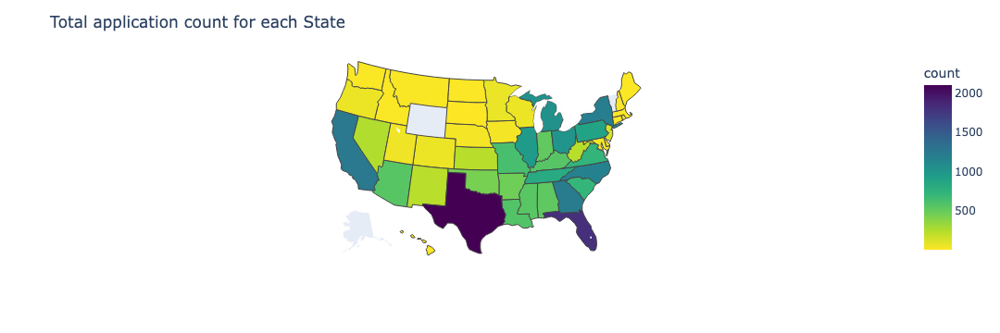

In [51]:
fig = px.choropleth(Data[['state','count','LTV','LTV_is_Zero']].groupby(['state']).sum(),
                    locations=Data[['state','count','LTV','LTV_is_Zero']].groupby(['state']).sum().index, 
                    locationmode="USA-states", 
                    scope="usa",
                    color='count',
                    color_continuous_scale="Viridis_r", 
                    # range_color=[NApol_ST['count'].min(),NApol_ST['count'].max()],
                    hover_data=['LTV','count','LTV_is_Zero'],
                    width = 50,
                    )
fig.update_layout(title_text = 'Total application count for each State',geo_scope='usa')
fig.show()

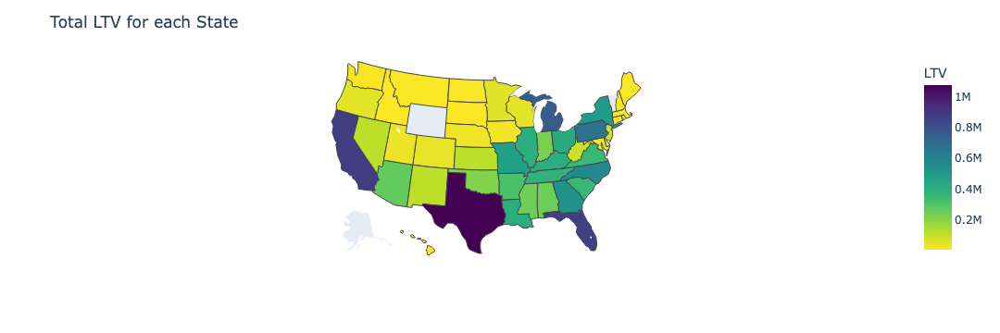

In [52]:
fig = px.choropleth(Data[['state','count','LTV','LTV_is_Zero']].groupby(['state']).sum(),
                    locations=Data[['state','count','LTV','LTV_is_Zero']].groupby(['state']).sum().index, 
                    locationmode="USA-states", 
                    scope="usa",
                    color='LTV',
                    color_continuous_scale="Viridis_r", 
                    # range_color=[NApol_ST['count'].min(),NApol_ST['count'].max()],
                    hover_data=['LTV','count','LTV_is_Zero'],
                    width = 50,
                    )
fig.update_layout(title_text = 'Total LTV for each State',geo_scope='usa')
fig.show()

In [53]:
# Data[Data['carrier']=='O65 - Aetna']

No. of LTV applications across states according to Carriers


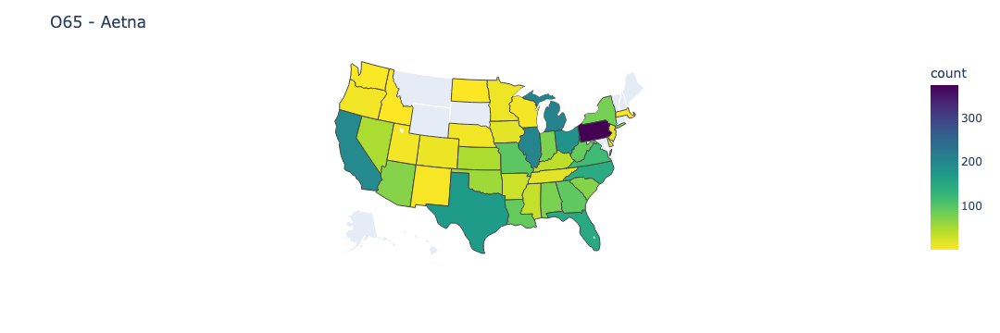

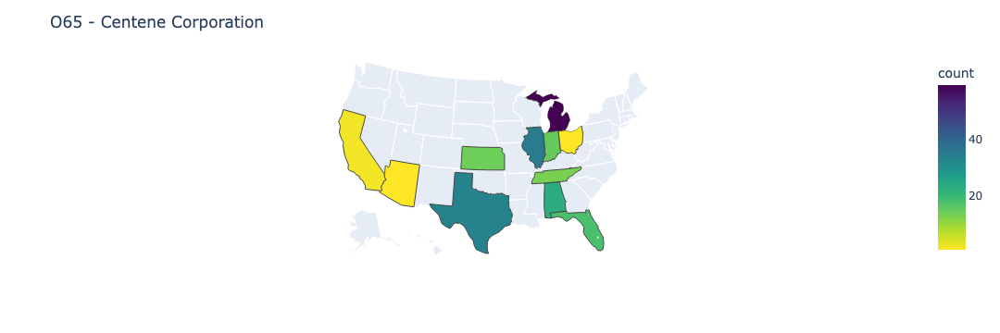

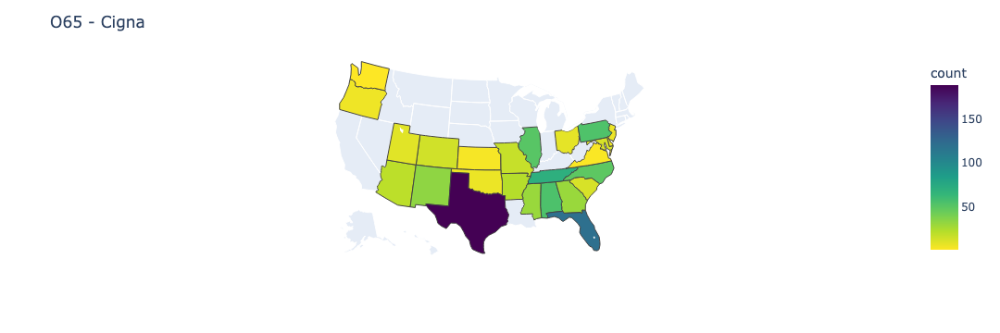

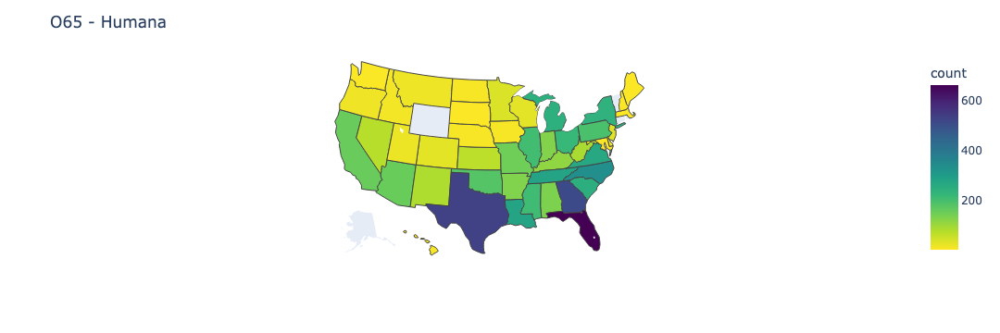

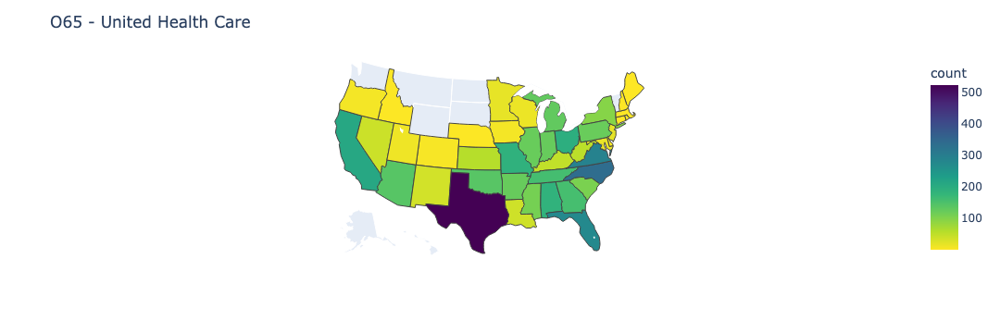

...

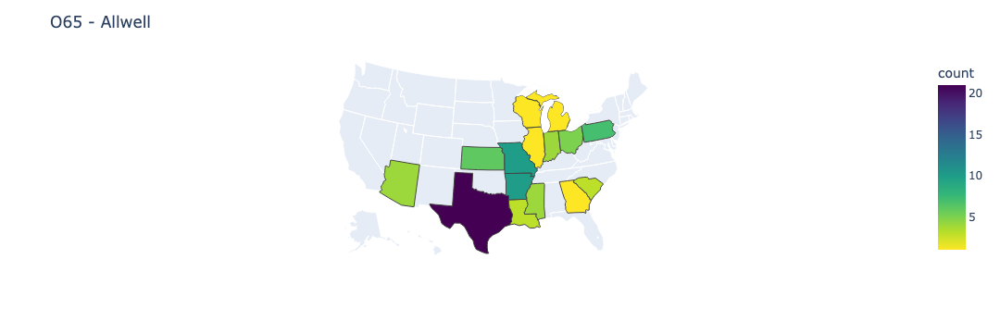

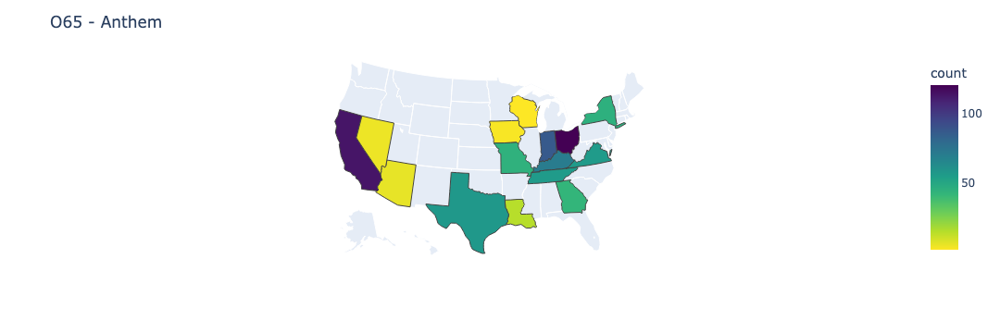

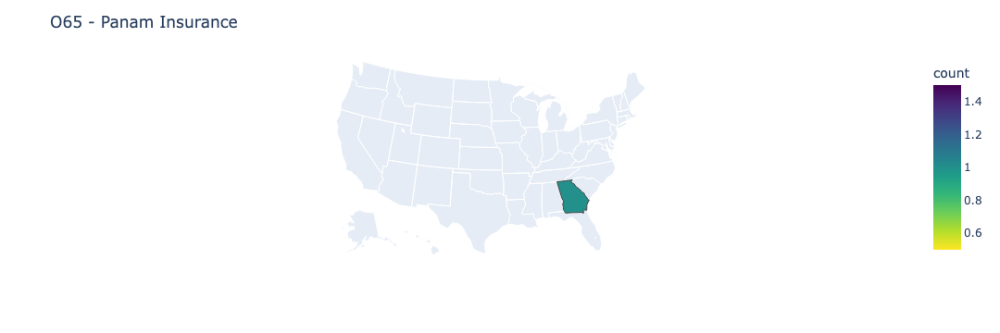

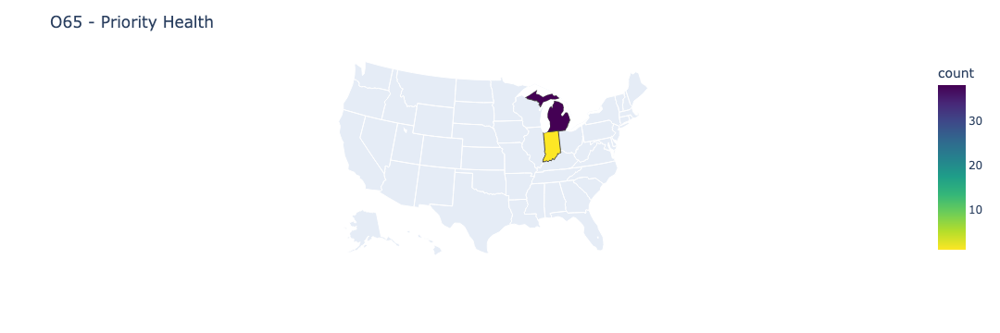

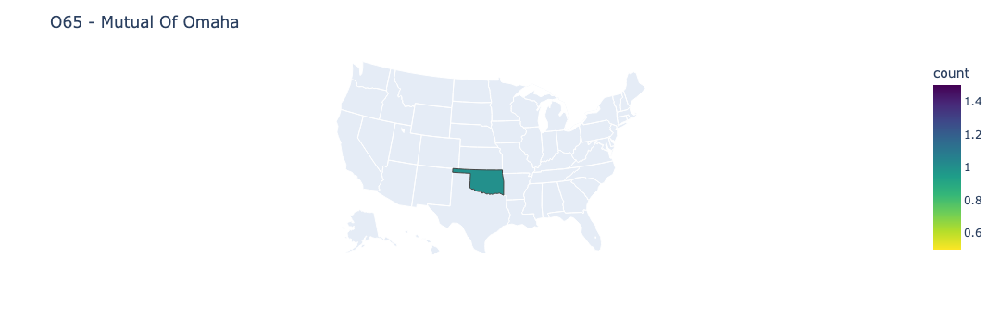

In [54]:
print("No. of LTV applications across states according to Carriers")
for c in Data.carrier.unique():
    # print(NApol_ST[NApol_ST['carrier']==c][['state','count']])
    fig = px.choropleth(Data[Data['carrier']==c],
                    locations='state', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='count',
                    color_continuous_scale="Viridis_r", 
                    # range_color=[0,185],
                    hover_data=['count','LTV_is_Zero','LTV','mean'],
                    width = 50,
                    )
    fig.update_layout(title_text = c,geo_scope='usa')
    fig.show()

In [55]:
df.LTV.isna().sum()

0

In [56]:
df[df.LTV.isna()].policy_id.isna().sum()

0

In [57]:
df.LTV.value_counts()

0.000000       3649
562.871667       29
561.024167       27
463.213333       27
542.250000       26
               ... 
1040.133333       1
998.333333        1
1001.816667       1
1118.487500       1
623.682500        1
Name: LTV, Length: 5107, dtype: int64

In [58]:
df[df.LTV.isna()]

,application_id,owner_email,application_name,policy_id,owner_id,owner_phone,parent_application_id,sk_referral_flag,bk_product_type,carrier,lead_id,first_name,last_name,submitted_weekday,submitted_day,submitted_month,submitted_year,area_code,age,age_range,jrn_boberdoo_amount,jrn_boberdoo_source,jrn_boberdoo_lead_type,jrn_id,jrn_date,jrn_tracking_file_path,jrn_event_date,jrn_firstparty,jrn_tcpa_universal_id,jrn_is_first_party,jrn_error,jrn_url,jrn_year,jrn_month,jrn_day,jrn_hour,jrn_request_f_name,jrn_request_l_name,jrn_request_email,jrn_request_phone1,jrn_request_address1,jrn_request_tcpa_universal_id,jrn_request_provider,jrn_request_age,jrn_request_dob,jrn_request_smoker,jrn_response_audit_authentic,jrn_response_audit_consumer_five_minutes,jrn_response_audit_consumer_hour,jrn_response_audit_consumer_twelve_hours,jrn_response_audit_consumer_twelve_consumer_day,jrn_response_audit_consumer_week,jrn_response_audit_data_integrity,jrn_response_audit_fields_email,jrn_response_audit_fields_f_name,jrn_response_audit_fields_l_name,jrn_response_audit_fields_phone1,jrn_response_audit_fields_address1,jrn_response_audit_device_five_minutes,jrn_response_audit_device_hour,jrn_response_audit_device_twelve_hours,jrn_response_audit_device_day,jrn_response_audit_device_week,jrn_response_audit_consumer_dupe_check,jrn_response_audit_entity_value,jrn_response_audit_ip_five_minutes,jrn_response_audit_ip_hour,jrn_response_audit_ip_twelve_hours,jrn_response_audit_ip_day,jrn_response_audit_ip_week,jrn_response_audit_lead_age,jrn_response_audit_age,jrn_response_audit_lead_duration,jrn_response_audit_duration,jrn_response_audit_lead_dupe_check,jrn_response_audit_lead_dupe,jrn_response_audit_lead_five_minutes,jrn_response_audit_lead_hour,jrn_response_audit_lead_twelve_hours,jrn_response_audit_lead_day,jrn_response_audit_lead_week,jrn_response_audit_market_leadid_tcpa_disclosure,jrn_response_audit_market_leadid_tcpa_prominence,jrn_response_audit_market_leadid_tcpa_contrast,jrn_response_audit_market_leadid_tcpa_visibility,jrn_response_audit_market_leadid_tcpa_stored,jrn_response_audit_market_leadid_tcpa_capture,jrn_response_audit_market_leadid_tcpa_result,jrn_response_audit_market_leadid_result,jrn_response_audit_market_result,jrn_response_audit_url_value,jrn_response_audit_result,jrn_response_audit_token,zcta_latitude,zcta_longitude,zcta_cdc_all_teeth_lost,zcta_cdc_annual_checkup,zcta_cdc_arthritis,zcta_cdc_binge_drinking,zcta_cdc_cancer_except_skin,zcta_cdc_cervical_cancer_screening,zcta_cdc_cholesterol_screening,zcta_cdc_chronic_kidney_disease,zcta_cdc_colorectal_cancer_screening,zcta_cdc_copd,zcta_cdc_core_preventive_services_for_older_men,zcta_cdc_core_preventive_services_for_older_women,zcta_cdc_coronary_heart_disease,zcta_cdc_current_asthma,zcta_cdc_current_smoking,zcta_cdc_dental_visit,zcta_cdc_depression,zcta_cdc_diabetes,zcta_cdc_general_health,zcta_cdc_health_insurance,zcta_cdc_high_blood_pressure,zcta_cdc_high_cholesterol,zcta_cdc_mammography,zcta_cdc_mental_health,zcta_cdc_obesity,zcta_cdc_physical_health,zcta_cdc_physical_inactivity,zcta_cdc_sleep_lt_7_hours,zcta_cdc_stroke,zcta_cdc_taking_bp_medication,zcta_cms_mapd_aetna_mrkt_share,zcta_cms_mapd_bcbs_mrkt_share,zcta_cms_mapd_cigna_mrkt_share,zcta_cms_mapd_humana_mrkt_share,zcta_cms_mapd_kaiser_mrkt_share,zcta_cms_mapd_lis_mrkt_share,zcta_cms_mapd_mrkt_leader,zcta_cms_mapd_other_mrkt_share,zcta_cms_mapd_penetration_2021,zcta_cms_mapd_penetration_2022,zcta_cms_mapd_penetration_pct_change,zcta_cms_mapd_priority_mrkt_share,zcta_cms_mapd_uhc_mrkt_share,zcta_cms_mapd_wellcare_mrkt_share,zcta_nyt_pct_dem,zcta_nyt_pct_gop,zcta_usc_housing_units,zcta_usc_land_area_m2,zcta_usc_median_home_value,zcta_usc_median_household_income,zcta_usc_occupied_housing_units,zcta_usc_pct_20_24,zcta_usc_pct_25_34,zcta_usc_pct_35_44,zcta_usc_pct_45_54,zcta_usc_pct_55_59,zcta_usc_pct_60_64,zcta_usc_pct_65_74,zcta_usc_pct_65_over,zcta_usc_pct_american_indian_alaska_native,zcta_usc_pct_asian,zcta_usc_pct_black,zcta_usc_pct_

In [59]:
# df.application_id.isna().sum()

In [60]:
# df[df.policy_id.isna()].LTV.isna().sum()

In [61]:
state_carrier = Data.groupby(by=['state','carrier'])['LTV','count','LTV_is_Zero'].sum()
state_carrier = state_carrier.reset_index()
single_state_carrier = state_carrier.sort_values(by=['LTV']).sort_values(by='LTV',ascending=False).groupby(['state']).first()
single_state_carrier.reset_index(inplace=True)
# state_carrier

/var/folders/5q/5s79sfds3w7_qbfv5xrwbj6r0000gn/T/ipykernel_7605/4243358173.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



In [62]:
state_carrier.head(6)

,state,carrier,LTV,count,LTV_is_Zero
0,AL,O65 - Aetna,26912.242500,77.0,10
1,AL,O65 - Centene Corporation,8660.038083,23.0,5
2,AL,O65 - Cigna,30844.593333,55.0,6
3,AL,O65 - Humana,56481.912500,133.0,31
4,AL,O65 - United Health Care,97655.259167,186.0,24
5,AL,O65 - Wellcare,24192.087500,55.0,5


In [63]:
single_state_carrier['Percentage_of_conversion'] = ( single_state_carrier['count']- single_state_carrier['LTV_is_Zero'] )/ single_state_carrier['count']

In [64]:
single_state_carrier

,state,carrier,LTV,count,LTV_is_Zero,Percentage_of_conversion
0,AL,O65 - United Health Care,97655.259167,186.0,24,0.870968
1,AR,O65 - Wellcare,115141.235167,157.0,40,0.745223
2,AZ,O65 - Wellcare,77233.558333,163.0,41,0.748466
3,CA,O65 - Wellcare,419439.095833,569.0,91,0.840070
4,CO,O65 - Humana,14912.787500,27.0,11,0.592593
5,CT,O65 - Wellcare,2513.250000,5.0,1,0.800000
6,DE,O65 - Humana,9123.591667,14.0,1,0.928571
7,FL,O65 - Wellcare,287647.470833,585.0,120,0.794872
8,GA,O65 - Humana,188684.795833,512.0,127,0.751953
9,HI,O65 - Humana,1847.483333,5.0,3,0.400000


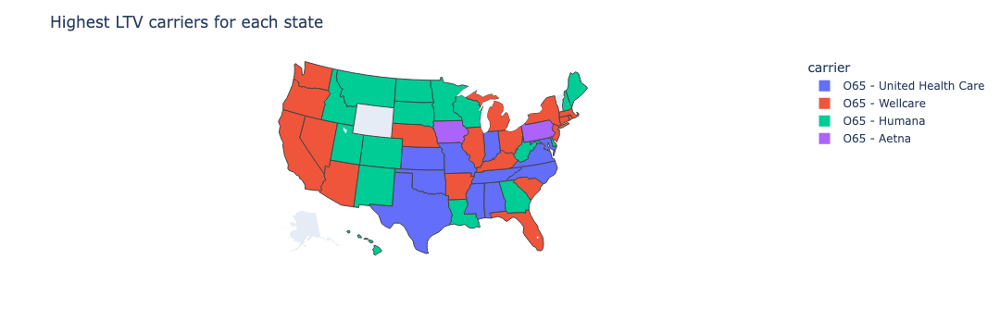

In [65]:
import plotly.express as px
fig = px.choropleth(single_state_carrier,
                    locations='state', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='carrier',
                    color_continuous_scale="Viridis_r", 
                    range_color=[1038,1896],
                    hover_data=['count','LTV_is_Zero','LTV','Percentage_of_conversion'],
                    width = 50
                    )
fig.update_layout(title_text = 'Highest LTV carriers for each state',geo_scope='usa')
fig.show()

In [66]:
df.groupby(by=['carrier'])['LTV'].describe()

,count,mean,std,min,25%,50%,75%,max
carrier,,,,,,,,
O65 - Aetna,2858.0,542.162911,303.982750,0.0,375.658333,444.631667,834.258333,1149.025000
O65 - Allwell,81.0,438.017423,186.452520,0.0,497.273125,520.306250,530.898125,580.326875
O65 - Anthem,719.0,477.540461,312.443177,0.0,325.465000,409.360000,715.470833,1317.500000
O65 - Centene Corporation,214.0,377.412680,269.660177,0.0,289.280396,366.662208,519.207000,1057.567417
O65 - Cigna,823.0,588.249514,291.406262,0.0,380.408333,472.406667,790.758333,1137.983333
O65 - Humana,6099.0,464.104995,329.067111,0.0,334.411667,423.627500,773.179167,1161.600000
O65 - Mutual Of Omaha,1.0,0.000000,NaN,0.0,0.000000,0.000000,0.000000,0.000000
O65 - Panam Insurance,1.0,0.000000,NaN,0.0,0.000000,0.000000,0.000000,0.000000
O65 - Priority Health,39.0,450.140817,198.234401,0.0,523.752813,536.614375,544.600312,557.630000


In [67]:
df.dtypes

application_id                                        object
owner_email                                           object
application_name                                      object
policy_id                                             object
owner_id                                              object
owner_phone                                          float64
parent_application_id                                 object
sk_referral_flag                                     float64
bk_product_type                                       object
carrier                                               object
lead_id                                              float64
first_name                                            object
last_name                                             object
submitted_weekday                                    float64
submitted_day                                        float64
submitted_month                                      float64
submitted_year          

In [68]:
df.groupby(by=['submitted_weekday'])['LTV','LTV_is_Zero'].sum().sort_values('LTV')

/var/folders/5q/5s79sfds3w7_qbfv5xrwbj6r0000gn/T/ipykernel_7605/3338712572.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,LTV,LTV_is_Zero
submitted_weekday,,
6.0,4.716721e+05,99
5.0,5.834709e+05,137
4.0,1.740381e+06,465
3.0,1.789309e+06,706
2.0,2.061075e+06,782
0.0,2.288133e+06,674
1.0,2.521623e+06,786


In [69]:
df.groupby(by=['submitted_weekday'])['LTV'].count().sort_values()

submitted_weekday
6.0     852
5.0    1093
4.0    3141
3.0    3436
2.0    3941
0.0    4199
1.0    4671
Name: LTV, dtype: int64

<AxesSubplot:xlabel='submitted_day'>

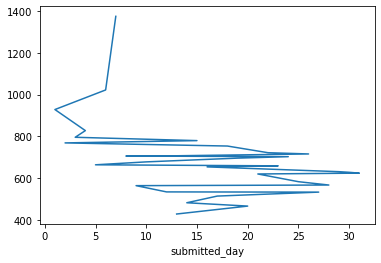

In [70]:
df.groupby(by=['submitted_day'])['LTV'].count().sort_values().plot()

In [71]:
df.groupby(by=['submitted_day'])['LTV','LTV_is_Zero'].sum().sort_values('LTV')

/var/folders/5q/5s79sfds3w7_qbfv5xrwbj6r0000gn/T/ipykernel_7605/1028814724.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,LTV,LTV_is_Zero
submitted_day,,
13.0,231193.389667,92
14.0,239664.323375,113
20.0,246699.158750,76
17.0,276397.510000,99
27.0,286467.928000,75
12.0,289559.734542,96
9.0,292577.542917,112
28.0,295979.727792,109
31.0,312740.213042,182


In [72]:
df.groupby(by=['submitted_day'])['LTV'].sum()

submitted_day
1.0     481401.119208
2.0     416548.387542
3.0     445102.082542
4.0     434971.066833
5.0     342673.676542
6.0     559948.581042
7.0     759461.138417
8.0     371860.298542
9.0     292577.542917
10.0    372271.223375
11.0    375331.490833
12.0    289559.734542
13.0    231193.389667
14.0    239664.323375
15.0    433493.077625
16.0    360562.823167
17.0    276397.510000
18.0    389000.521667
19.0    413071.750083
20.0    246699.158750
21.0    332371.093708
22.0    387281.140500
23.0    349751.416042
24.0    367705.874417
25.0    316917.986667
26.0    392239.487542
27.0    286467.928000
28.0    295979.727792
29.0    347504.101458
30.0    334916.305083
31.0    312740.213042
Name: LTV, dtype: float64

In [73]:
df.groupby(by=['submitted_month'])['LTV'].sum()

submitted_month
1.0     1.860147e+06
2.0     1.806283e+06
3.0     1.023363e+06
4.0     3.835865e+05
5.0     1.694331e+05
6.0     1.380209e+05
7.0     1.166160e+05
8.0     1.099665e+05
9.0     3.223784e+04
10.0    1.094447e+06
11.0    2.893557e+06
12.0    1.828007e+06
Name: LTV, dtype: float64

In [74]:
df.groupby(by=['submitted_year'])['LTV'].sum()

submitted_year
2019.0    9.585083e+02
2020.0    4.161701e+05
2021.0    6.805784e+06
2022.0    4.232752e+06
Name: LTV, dtype: float64

In [75]:
# df['submitted_date'] = 
df.rename(columns = {'submitted_year':'year','submitted_month':'month','submitted_day':'day'}, inplace=True)
df['submitted_date'] = pd.to_datetime(df[['year', 'month', 'day']])
# df['submitted_date']

In [76]:
date_LTV = df[['submitted_date','LTV']].sort_values(by='submitted_date')
date_LTV

,submitted_date,LTV
9033,2019-02-21,958.508333
8734,2020-07-01,922.712500
1811,2020-08-25,921.308333
9017,2020-08-25,0.000000
2056,2020-08-28,920.700000
...,...,...
21359,2022-06-21,0.000000
21360,2022-06-21,0.000000
21361,2022-06-21,0.000000
21363,2022-06-21,0.000000


In [77]:
date_LTV = df.groupby(by=['submitted_date'])['LTV','LTV_is_Zero'].sum()
# date_LTV['submission'] = date_LTV.map(lambda dt: dt.strftime('%Y-%m'))
date_LTV

/var/folders/5q/5s79sfds3w7_qbfv5xrwbj6r0000gn/T/ipykernel_7605/101327400.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,LTV,LTV_is_Zero
submitted_date,,
2019-02-21,958.508333,0
2020-07-01,922.712500,0
2020-08-25,921.308333,1
2020-08-28,920.700000,0
2020-08-31,939.558333,1
...,...,...
2022-06-14,0.000000,25
2022-06-15,623.682500,17
2022-06-16,0.000000,12


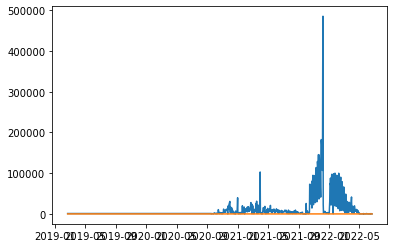

In [78]:
plt.plot(date_LTV.index, date_LTV, linestyle = 'solid')
plt.rcParams["figure.figsize"] = (50,3)

In [79]:
date_LTV['date'] = date_LTV.index

<AxesSubplot:xlabel='date'>

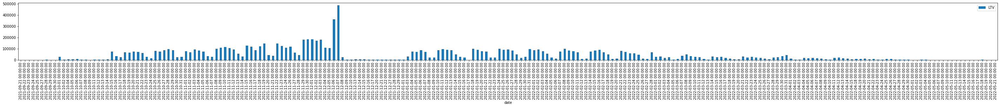

In [80]:
date_LTV['2021-09-21':'2022-05-21'].plot(kind='bar', x='date', y=['LTV'])
# date_LTV.plot(kind='bar',x=date_LTV.index, y='LTV')
# plt.rcParams["figure.figsize"] = (100,3)

<AxesSubplot:xlabel='date'>

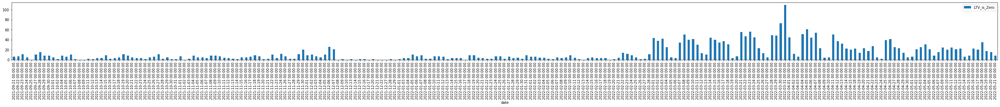

In [81]:
date_LTV['2021-09-21':'2022-05-21'].plot(kind='bar', x='date', y=['LTV_is_Zero'])


<AxesSubplot:xlabel='date'>

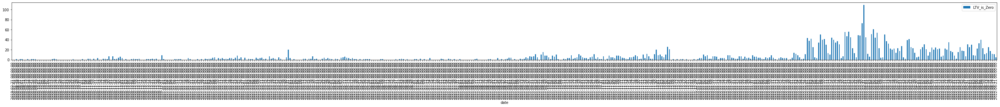

In [82]:
date_LTV.plot(kind='bar', x='date', y=['LTV_is_Zero'])


In [83]:
df[['carrier','gender','LTV']].sort_values(by='gender')


,carrier,gender,LTV
18258,O65 - Wellcare,F,1031.220833
9596,O65 - Humana,F,297.780000
9598,O65 - United Health Care,F,952.295833
9599,O65 - Humana,F,456.714167
9600,O65 - Wellcare,F,1029.616667
...,...,...,...
10956,O65 - Humana,NaN,0.000000
10966,O65 - Humana,NaN,0.000000
10968,O65 - Humana,NaN,379.905833
10994,O65 - Humana,NaN,752.495833


In [84]:
df.groupby(by=['gender'])['LTV'].describe()


,count,mean,std,min,25%,50%,75%,max
gender,,,,,,,,
F,11964.0,529.041419,321.001754,0.0,375.658333,488.487500,776.405208,1317.204167
M,9010.0,545.124991,330.304605,0.0,381.200833,506.344167,827.380208,1317.500000


In [85]:
df.groupby(by=['carrier','gender'])['LTV'].describe()


count        mean         std  min  \
carrier                   gender                                        
O65 - Aetna               F       1659.0  538.543430  305.106748  0.0   
                          M       1156.0  548.205038  301.158586  0.0   
O65 - Allwell             F         47.0  418.214973  203.068627  0.0   
                          M         32.0  478.218789  140.905999  0.0   
O65 - Anthem              F        428.0  482.444663  318.253870  0.0   
                          M        284.0  481.919985  298.587461  0.0   
O65 - Centene Corporation F        111.0  350.062484  256.105702  0.0   
                          M        103.0  406.887164  281.822002  0.0   
O65 - Cigna               F        420.0  565.291905  258.932401  0.0   
                          M        344.0  597.709399  293.748740  0.0   
O65 - Humana              F       3417.0  450.388294  318.801531  0.0   
                          M       2562.0  479.050748  338.095799  0.0   
O65 - Priority Health     F         16.0  504.116250  134.824987  0.0   
                          M         18.0  404.535590  229.112744  0.0   
O65 - United Health Care  F       2395.0  623.580718  289.086208  0.0   
                          M       1681.0  642.147780  281.912851  0.0   
O65 - Wellcare            F       3471.0  545.395432  339.997231  0.0   
                          M       2830.0  552.685999  354.590893  0.0   

                                         25%         50%         75%  \
carrier                   gender                                       
O65 - Aetna               F       375.658333  436.010000  838.843750   
                          M       376.736042  453.253333  830.338542   
O65 - Allwell             F       475.080625  519.970000  532.663438   
                          M       504.628594  523.164375  531.360469   
O65 - Anthem              F       325.018750  406.087500  728.200000   
                          M       337.662500  417.987500  697.191250   
O65 - Centene Corporation F         0.000000  362.779250  462.626750   
                          M       309.249896  369.990458  741.545562   
O65 - Cigna               F       371.813333  458.400000  776.429167   
                          M       392.186667  708.291667  792.658333   
O65 - Humana              F       332.048333  419.491667  729.683333   
                          M       340.320000  430.422083  851.882292   
O65 - Priority Health     F       525.518125  536.866562  543.087188   
                          M       360.073438  528.544375  540.397187   
O65 - United Health Care  F       442.168333  666.331667  836.920833   
                          M       449.558333  682.959167  898.158333   
O65 - Wellcare            F       443.250000  522.750000  742.500000   
                          M       445.500000  531.750000  821.812500   

                                          max  
carrier                   gender               
O65 - Aetna               F       1149.025000  
                          M       1146.362500  
O65 - Allwell             F        561.328750  
                          M        580.326875  
O65 - Anthem              F       1317.204167  
                          M       1317.500000  
O65 - Centene Corporation F        887.606083  
                          M       1057.567417  
O65 - Cigna               F       1137.983333  
                          M       1084.783333  
O65 - Humana              F       1159.775000  
                          M       1161.600000  
O65 - Priority Health     F        557.630000  
                          M        554.099375  
O65 - United Health Care  F       1165.295833  
                          M       1191.329167  
O65 - Wellcare            F       1266.391667  
                          M       1268.958333

In [86]:
df.groupby(by=['carrier','age_range'])['LTV'].describe()


count        mean         std  \
carrier                   age_range                                      
O65 - Aetna               65 to 75      1310.0  528.164173  313.090412   
                          75 to 85       769.0  554.364332  304.447935   
                          Less than 65   489.0  546.567848  276.898705   
                          More than 85   290.0  565.616152  303.073372   
O65 - Allwell             65 to 75        52.0  444.960288  175.763283   
                          75 to 85         8.0  462.707500  187.242602   
                          Less than 65    14.0  413.567589  224.347816   
                          More than 85     7.0  407.124286  217.358024   
O65 - Anthem              65 to 75       359.0  466.269684  317.253151   
                          75 to 85       169.0  515.975917  304.275940   
                          Less than 65   127.0  480.890197  301.614649   
                          More than 85    64.0  432.621719  324.082154   
O65 - Centene Corporation 65 to 75       112.0  340.664043  265.936056   
                          75 to 85        50.0  439.007958  248.282353   
                          Less than 65    35.0  417.398331  293.591735   
                          More than 85    17.0  356.035370  283.128571   
O65 - Cigna               65 to 75       375.0  587.394382  283.186147   
                          75 to 85       204.0  565.754085  276.540334   
                          Less than 65   114.0  631.648480  287.205361   
                          More than 85   130.0  587.959205  336.949161   
O65 - Humana              65 to 75      2958.0  457.863583  337.930903   
                          75 to 85      1541.0  468.127282  323.336404   
                          Less than 65   984.0  470.045071  314.677092   
                          More than 85   616.0  474.524996  322.742204   
O65 - Mutual Of Omaha     More than 85     1.0    0.000000         NaN   
O65 - Panam Insurance     75 to 85         1.0    0.000000         NaN   
O65 - Priority Health     65 to 75        19.0  454.973980  202.575784   
                          75 to 85         4.0  540.439219   13.198526   
                          Less than 65    10.0  405.018562  225.326083   
                          More than 85     6.0  449.840625  220.783754   
O65 - United Health Care  65 to 75      1978.0  615.840779  295.194259   
                          75 to 85       967.0  639.239241  284.483443   
                          Less than 65   809.0  651.467347  279.540505   
                          More than 85   387.0  675.295239  269.327613   
O65 - Wellcare            65 to 75      3166.0  531.329609  362.133153   
                          75 to 85      1529.0  564.341882  331.486350   
                          Less than 65  1113.0  566.965997  340.984277   
                          More than 85   549.0  571.127254  331.700200   

                                             min         25%         50%  \
carrier                   age_range                                        
O65 - Aetna               65 to 75        0.0000  372.117292  436.933750   
                          75 to 85        0.0000  378.737500  449.558333   
                          Less than 65    0.0000  376.890000  432.930833   
                          More than 85    0.0000  376.890000  451.405833   
O65 - Allwell             65 to 75        0.0000  486.597188  518.961250   
                          75 to 85        0.0000  519.423594  521.987500   
                          Less than 65    0.0000  507.612813  522.491875   
                          More than 85    0.0000  353.807812  520.306250   
O65 - Anthem              65 to 75        0.0000  317.135000  373.660000   
                          75 to 85        0.0000  340.935000  455.770000   
                          Less than 65    0.0000  342.720000  389.130000   
                          More than 85    0.0000    0.000000  364.735000   
O65 - Centene Co

In [87]:
df.groupby(by=['age_range'])['LTV'].count()


age_range
65 to 75        10329
75 to 85         5242
Less than 65     3695
More than 85     2067
Name: LTV, dtype: int64

In [88]:
df.groupby(by=['age_range'])['LTV','LTV_is_Zero'].sum()


/var/folders/5q/5s79sfds3w7_qbfv5xrwbj6r0000gn/T/ipykernel_7605/273756218.py:1: FutureWarning:

Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.



,LTV,LTV_is_Zero
age_range,,
65 to 75,5.404179e+06,2010
75 to 85,2.859141e+06,799
Less than 65,2.045396e+06,530
More than 85,1.146948e+06,310


In [89]:

# policy_null = df[df.policy_id.isna()]
# pos_ltv = policy_null[policy_null.LTV.isna()]
# pos_ltv.count()

In [90]:
# df.LTV.isna().sum()

In [91]:
# LTV_na=df[df.LTV.isna()]

In [92]:
# LTV_na.head(5)

In [93]:
# LTV_na.policy_id.isna().sum()

In [94]:
(df['LTV'] == 0).sum()

3649

In [95]:
df.application_id.count() - (df.LTV.isna().sum()+(df['LTV'] == 0).sum())

17684

In [96]:
18173 + df.LTV.isna().sum()

18173

In [97]:
df[['gender','LTV']].groupby(['gender']).describe()


LTV                                                       \
          count        mean         std  min         25%         50%   
gender                                                                 
F       11964.0  529.041419  321.001754  0.0  375.658333  488.487500   
M        9010.0  545.124991  330.304605  0.0  381.200833  506.344167   

                                 
               75%          max  
gender                           
F       776.405208  1317.204167  
M       827.380208  1317.500000

In [98]:
# sns.jointplot(x='gender',y='LTV',data = df, height=10)

In [99]:
# sns.jointplot(x='age_range',y='LTV',data = df, height=10)

In [100]:
# df[['age_range','LTV']].groupby(['age_range']).describe()


In [101]:
# df[['age_range','LTV']].groupby(['age_range']).sum()

In [102]:
# df[['carrier','LTV']].groupby(['carrier']).sum()


In [103]:
df.LTV.mean()

536.9926485218504

In [104]:
# df.state

In [105]:
# state_carrier = df.groupby(by=['state','carrier'])['LTV'].sum()
# state_carrier = state_carrier.reset_index()
# state_carrier.head()



In [106]:
# state_carrier_describe = df.groupby(by=['state','carrier'])['LTV'].describe()
# state_carrier_describe = state_carrier_describe.reset_index()
# state_carrier_describe.head(5)

In [107]:
# state_carrier = pd.merge(state_carrier, state_carrier_describe, on=['state', 'carrier'])
# state_carrier.head(5)

In [108]:
# state_carrier.reset_index(inplace=True)
# state_carrier = state_carrier.sort_values(by=['LTV']).sort_values(by='LTV',ascending=False).groupby(['state']).first()


In [109]:
# state_carrier['state'] = state_carrier.index

In [110]:
# state_carrier

In [111]:
# import plotly.express as px
# fig = px.choropleth(Data,
#                     locations='state', 
#                     locationmode="USA-states", 
#                     scope="usa",
#                     color='carrier',
#                     color_continuous_scale="Viridis_r", 
#                     range_color=[1038,1896],
#                     width = 50,
#                     hover_data=['LTV','count','mean','std','min','max','50%']
#                     )
# fig.show()

In [112]:
# import plotly.express as px
# fig = px.choropleth(df,
#                     locations='state', 
#                     locationmode="USA-states", 
#                     scope="usa",
#                     color='LTV',
#                     color_continuous_scale="Viridis_r", 
#                     range_color=[0,1896],
#                     width = 50
#                     )
# fig.show()

In [113]:
df['carrier'].value_counts()


O65 - Wellcare               6357
O65 - Humana                 6099
O65 - United Health Care     4141
O65 - Aetna                  2858
O65 - Cigna                   823
O65 - Anthem                  719
O65 - Centene Corporation     214
O65 - Allwell                  81
O65 - Priority Health          39
O65 - Mutual Of Omaha           1
O65 - Panam Insurance           1
Name: carrier, dtype: int64

## Test_____

#### Percentage of conversion for Each Carrier

In [114]:
test_carrier_conversion_MO = (Data[['state','count','carrier','LTV_is_Zero','LTV']].groupby(['carrier']).sum())


In [115]:
test_carrier_conversion_MO['percentage_of_conversion'] = ( test_carrier_conversion_MO['count']- test_carrier_conversion_MO['LTV_is_Zero'] )/ test_carrier_conversion_MO['count']
test_carrier_conversion_MO['mean_test'] = test_carrier_conversion_MO['LTV']/( test_carrier_conversion_MO['count']- test_carrier_conversion_MO['LTV_is_Zero'] )
test_carrier_conversion_MO['Mean_actual'] = test_carrier_conversion_MO['LTV']/ test_carrier_conversion_MO['count']

test_carrier_conversion_MO.sort_values('percentage_of_conversion')

,count,LTV_is_Zero,LTV,percentage_of_conversion,mean_test,Mean_actual
carrier,,,,,,
O65 - Mutual Of Omaha,1.0,1,0.000000e+00,0.000000,NaN,0.000000
O65 - Panam Insurance,1.0,1,0.000000e+00,0.000000,NaN,0.000000
O65 - Centene Corporation,214.0,52,8.076631e+04,0.757009,498.557492,377.412680
O65 - Humana,6099.0,1396,2.830576e+06,0.771110,601.866121,464.104995
O65 - Wellcare,6357.0,1253,3.489650e+06,0.802894,683.708914,548.946091
O65 - Anthem,719.0,126,3.433516e+05,0.824757,579.007743,477.540461
O65 - Priority Health,39.0,6,1.755549e+04,0.846154,531.984602,450.140817
O65 - Allwell,81.0,11,3.547941e+04,0.864198,506.848732,438.017423
O65 - Aetna,2858.0,340,1.549502e+06,0.881036,615.369976,542.162911


In [116]:
# test_Data = df.groupby(by=['state','carrier'])['LTV'].describe()
# test_Data = test_Data.reset_index()
# (test_Data[['state','count','carrier','mean']].groupby(['carrier']).mean())
# test_Data
df[['LTV','carrier']].groupby('carrier').mean()

,LTV
carrier,
O65 - Aetna,542.162911
O65 - Allwell,438.017423
O65 - Anthem,477.540461
O65 - Centene Corporation,377.412680
O65 - Cigna,588.249514
O65 - Humana,464.104995
O65 - Mutual Of Omaha,0.000000
O65 - Panam Insurance,0.000000
O65 - Priority Health,450.140817


#### Percentage of conversion for Each state

In [117]:
test_state_conv = Data[['state','count','LTV','LTV_is_Zero']].groupby(['state']).sum().sort_values('count',ascending=False)
test_state_conv['percentage_of_conversion'] = ( test_state_conv['count']- test_state_conv['LTV_is_Zero'] )/ test_state_conv['count']
test_state_conv.sort_values('percentage_of_conversion')

,count,LTV,LTV_is_Zero,percentage_of_conversion
state,,,,
HI,6.0,2.957308e+03,3,0.500000
ME,7.0,3.944504e+03,2,0.714286
RI,15.0,6.343175e+03,4,0.733333
CO,58.0,3.923757e+04,15,0.741379
MS,553.0,2.409943e+05,136,0.754069
TN,827.0,3.885005e+05,177,0.785973
LA,579.0,4.095414e+05,120,0.792746
NV,250.0,1.069637e+05,50,0.800000
AR,470.0,3.152579e+05,93,0.802128


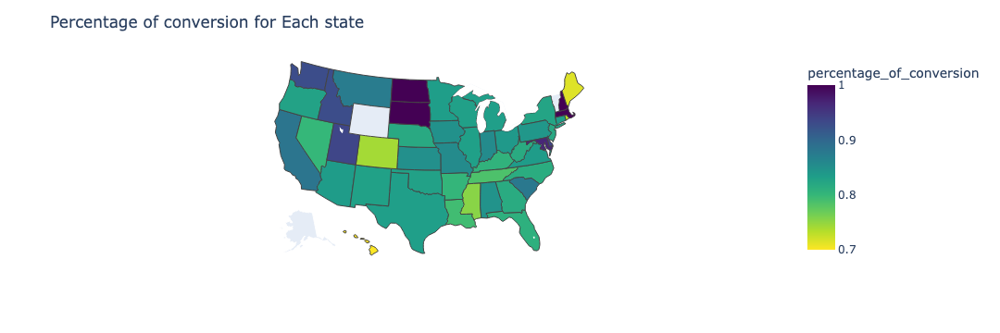

In [118]:
fig = px.choropleth(test_state_conv,
                    locations=test_state_conv.index, 
                    locationmode="USA-states", 
                    scope="usa",
                    color='percentage_of_conversion',
                    color_continuous_scale="Viridis_r", 
                    range_color=[0.7,1],
                    hover_data=['LTV','count','LTV_is_Zero','percentage_of_conversion'],
                    width = 50,
                    )
fig.update_layout(title_text = 'Percentage of conversion for Each state',geo_scope='usa')
fig.show()

### Top and bottom performing carriers in each state

In [119]:
state_carrier['percentage_of_conversion'] = ( state_carrier['count']- state_carrier['LTV_is_Zero'] )/ state_carrier['count']
state_carrier[state_carrier['state']=='MT']

,state,carrier,LTV,count,LTV_is_Zero,percentage_of_conversion
125,MT,O65 - Humana,7609.168333,16.0,2,0.875


In [120]:
state_carrier_ConvPerc_top = state_carrier.sort_values(by=['percentage_of_conversion']).sort_values(by='percentage_of_conversion',ascending=False).groupby(['state']).first()
state_carrier_ConvPerc_top.reset_index(inplace=True)

In [121]:
state_carrier_ConvPerc_top

,state,carrier,LTV,count,LTV_is_Zero,percentage_of_conversion
0,AL,O65 - Wellcare,24192.087500,55.0,5,0.909091
1,AR,O65 - Cigna,17164.050000,22.0,1,0.954545
2,AZ,O65 - Centene Corporation,842.599875,1.0,0,1.000000
3,CA,O65 - Centene Corporation,1813.509375,2.0,0,1.000000
4,CO,O65 - United Health Care,5643.070833,6.0,0,1.000000
5,CT,O65 - United Health Care,960.283333,1.0,0,1.000000
6,DE,O65 - Aetna,5629.803333,10.0,0,1.000000
7,FL,O65 - Aetna,63361.249167,149.0,8,0.946309
8,GA,O65 - Allwell,202.608750,1.0,0,1.000000
9,HI,O65 - Wellcare,1109.825000,1.0,0,1.000000


In [122]:
state_carrier_ConvPerc_low = state_carrier.sort_values(by=['percentage_of_conversion']).sort_values(by='percentage_of_conversion',ascending=True).groupby(['state']).first()
state_carrier_ConvPerc_low.reset_index(inplace=True)

In [123]:
state_carrier_ConvPerc_low

,state,carrier,LTV,count,LTV_is_Zero,percentage_of_conversion
0,AL,O65 - Humana,56481.912500,133.0,31,0.766917
1,AR,O65 - Wellcare,115141.235167,157.0,40,0.745223
2,AZ,O65 - Wellcare,77233.558333,163.0,41,0.748466
3,CA,O65 - Humana,89886.284167,156.0,28,0.820513
4,CO,O65 - Humana,14912.787500,27.0,11,0.592593
5,CT,O65 - Wellcare,2513.250000,5.0,1,0.800000
6,DE,O65 - Cigna,3546.926667,5.0,1,0.800000
7,FL,O65 - Centene Corporation,6802.006500,18.0,5,0.722222
8,GA,O65 - Panam Insurance,0.000000,1.0,1,0.000000
9,HI,O65 - Humana,1847.483333,5.0,3,0.400000


#### High conversion carriers in different states

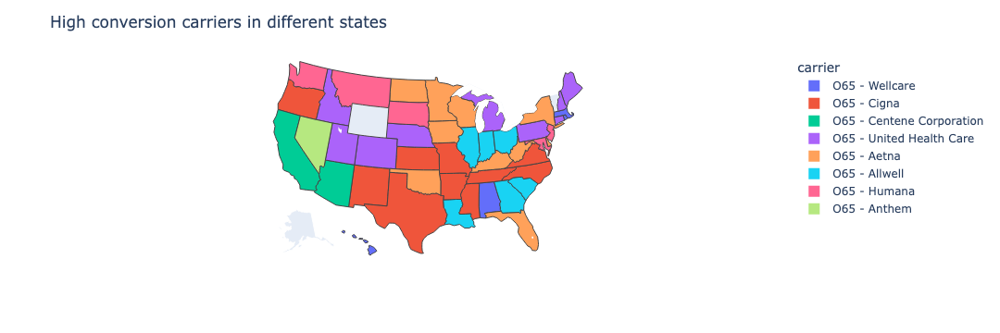

In [124]:
import plotly.express as px
fig = px.choropleth(state_carrier_ConvPerc_top,
                    locations='state', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='carrier',
                    color_continuous_scale="Viridis_r", 
                    range_color=[1038,1896],
                    hover_data=['count','LTV_is_Zero','LTV','percentage_of_conversion'],
                    width = 50
                    )
fig.update_layout(title_text = 'High conversion carriers in different states',geo_scope='usa')
fig.show()

#### Low conversion carriers in different states

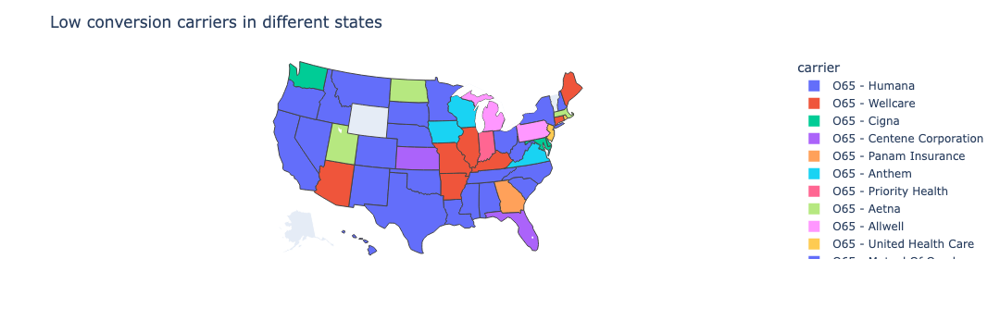

In [125]:
import plotly.express as px
fig = px.choropleth(state_carrier_ConvPerc_low,
                    locations='state', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='carrier',
                    color_continuous_scale="Viridis_r", 
                    range_color=[1038,1896],
                    hover_data=['count','LTV_is_Zero','LTV','percentage_of_conversion'],
                    width = 50
                    )
fig.update_layout(title_text = 'Low conversion carriers in different states',geo_scope='usa')
fig.show()

In [126]:
state_carrier_ConvPerc_low

,state,carrier,LTV,count,LTV_is_Zero,percentage_of_conversion
0,AL,O65 - Humana,56481.912500,133.0,31,0.766917
1,AR,O65 - Wellcare,115141.235167,157.0,40,0.745223
2,AZ,O65 - Wellcare,77233.558333,163.0,41,0.748466
3,CA,O65 - Humana,89886.284167,156.0,28,0.820513
4,CO,O65 - Humana,14912.787500,27.0,11,0.592593
5,CT,O65 - Wellcare,2513.250000,5.0,1,0.800000
6,DE,O65 - Cigna,3546.926667,5.0,1,0.800000
7,FL,O65 - Centene Corporation,6802.006500,18.0,5,0.722222
8,GA,O65 - Panam Insurance,0.000000,1.0,1,0.000000
9,HI,O65 - Humana,1847.483333,5.0,3,0.400000


#### Percentage of conversion for each carrier across states

In [127]:
Data.head()

,state,carrier,LTV,LTV_is_Zero,count,mean,std,min,25%,50%,75%,max
0,AL,O65 - Aetna,26912.242500,10,77.0,349.509643,179.224025,0.0,350.409167,363.957500,394.133333,1030.987500
1,AL,O65 - Centene Corporation,8660.038083,5,23.0,376.523395,250.611305,0.0,348.634187,402.718250,422.410396,895.712792
2,AL,O65 - Cigna,30844.593333,6,55.0,560.810788,273.521907,0.0,367.993333,721.980000,741.080000,1039.183333
3,AL,O65 - Humana,56481.912500,31,133.0,424.676034,326.139566,0.0,350.364167,398.221667,430.126667,1022.595833
4,AL,O65 - United Health Care,97655.259167,24,186.0,525.028275,264.176234,0.0,436.625833,455.408750,720.678958,1027.733333


In [128]:
Data['percentage_of_conversion'] = ( Data['count']- Data['LTV_is_Zero'] )/ Data['count']

# Data[Data['carrier']=='O65 - Aetna']

Percentage of conversion for each carrier across states


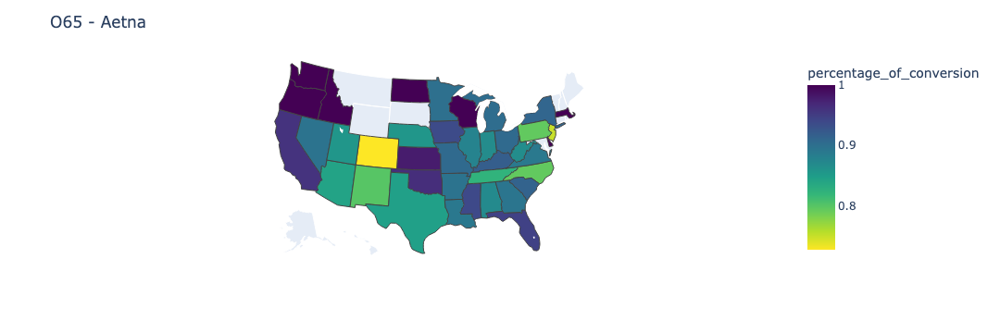

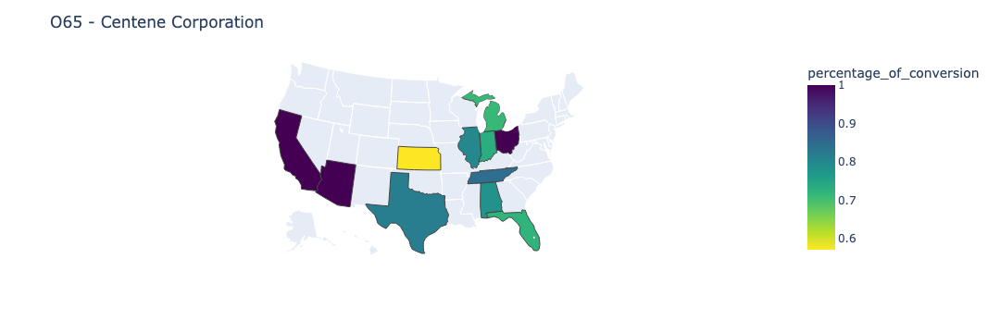

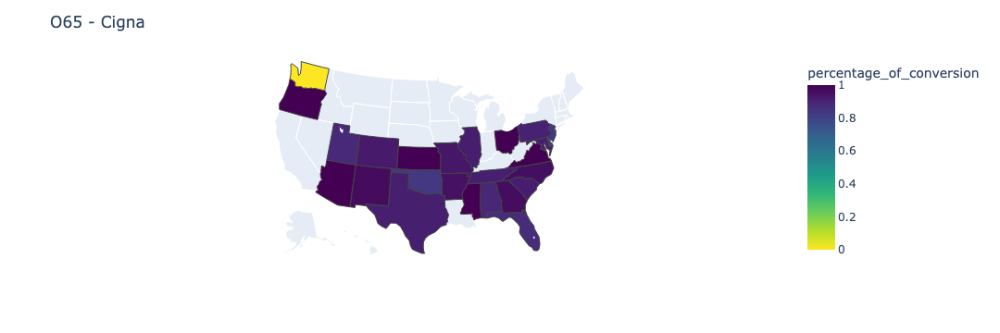

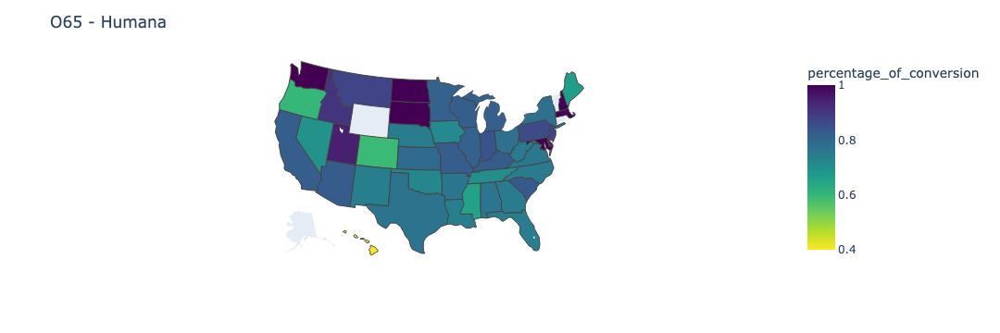

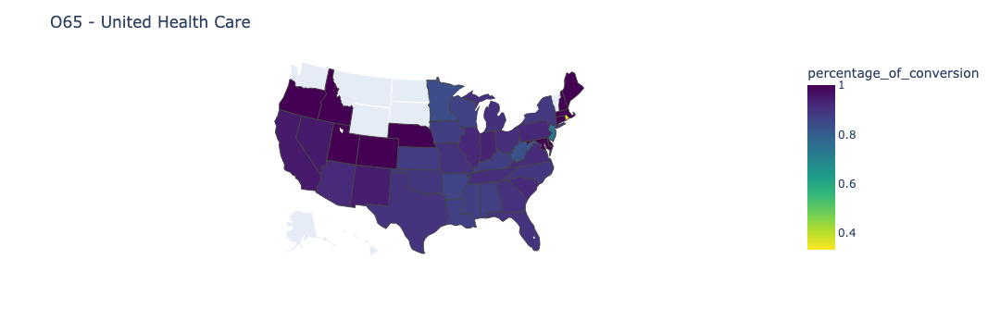

...

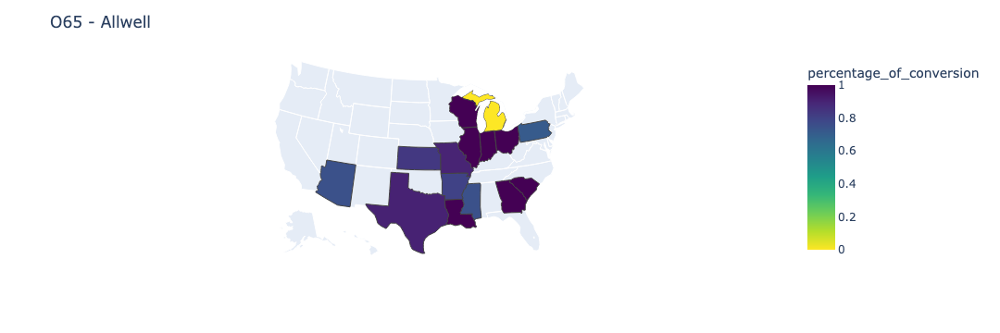

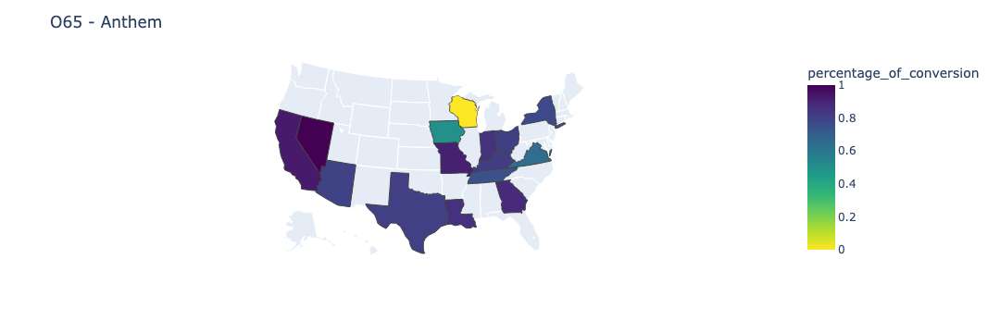

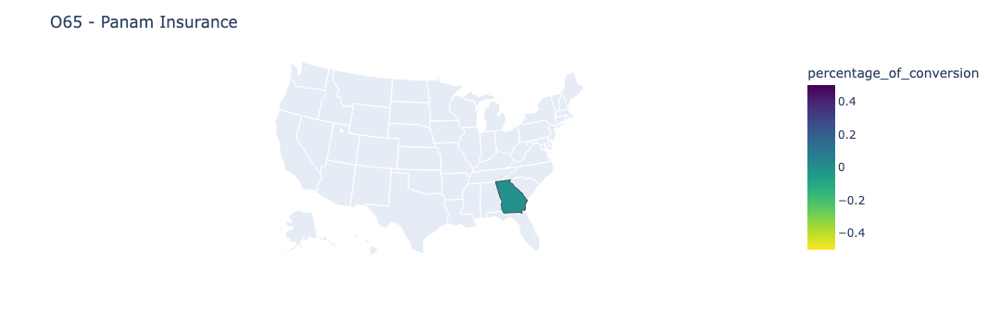

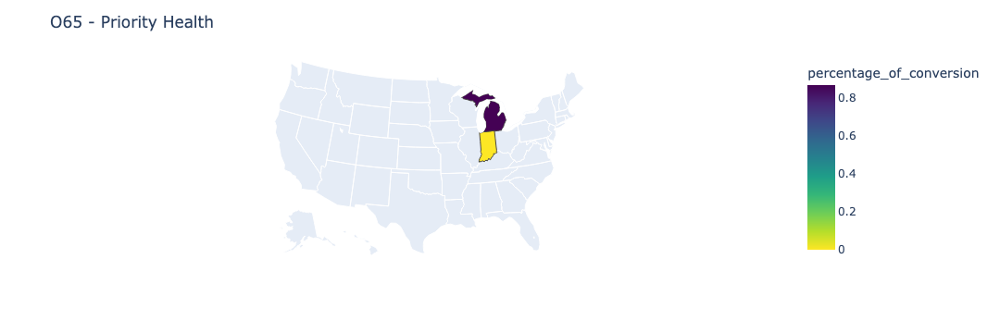

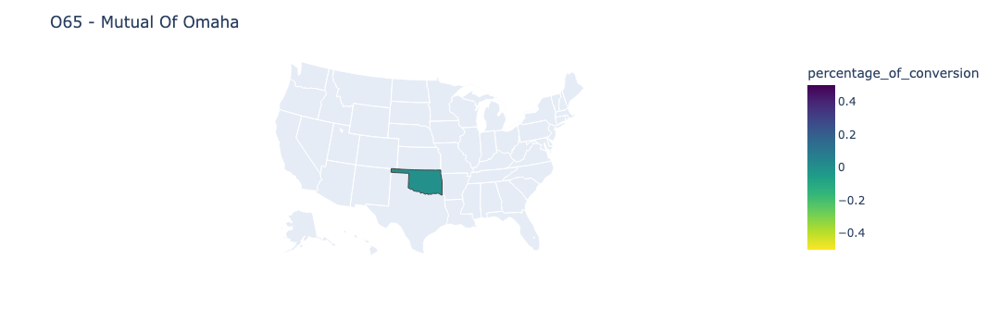

In [129]:
print("Percentage of conversion for each carrier across states")
for c in Data.carrier.unique():
    # print(NApol_ST[NApol_ST['carrier']==c][['state','count']])
    fig = px.choropleth(Data[Data['carrier']==c],
                    locations='state', 
                    locationmode="USA-states", 
                    scope="usa",
                    color='percentage_of_conversion',
                    color_continuous_scale="Viridis_r", 
                    # range_color=[0,185],
                    hover_data=['count','LTV_is_Zero','LTV','mean'],
                    width = 50,
                    )
    fig.update_layout(title_text = c,geo_scope='usa')
    fig.show()

In [142]:
df[df['carrier']=='O65 - Aetna'].sort_values(by='submitted_date',ascending=False).nlargest(64, columns=['submitted_date'])

,application_id,owner_email,application_name,policy_id,owner_id,owner_phone,parent_application_id,sk_referral_flag,bk_product_type,carrier,lead_id,first_name,last_name,submitted_weekday,day,month,year,area_code,age,age_range,jrn_boberdoo_amount,jrn_boberdoo_source,jrn_boberdoo_lead_type,jrn_id,jrn_date,jrn_tracking_file_path,jrn_event_date,jrn_firstparty,jrn_tcpa_universal_id,jrn_is_first_party,jrn_error,jrn_url,jrn_year,jrn_month,jrn_day,jrn_hour,jrn_request_f_name,jrn_request_l_name,jrn_request_email,jrn_request_phone1,jrn_request_address1,jrn_request_tcpa_universal_id,jrn_request_provider,jrn_request_age,jrn_request_dob,jrn_request_smoker,jrn_response_audit_authentic,jrn_response_audit_consumer_five_minutes,jrn_response_audit_consumer_hour,jrn_response_audit_consumer_twelve_hours,jrn_response_audit_consumer_twelve_consumer_day,jrn_response_audit_consumer_week,jrn_response_audit_data_integrity,jrn_response_audit_fields_email,jrn_response_audit_fields_f_name,jrn_response_audit_fields_l_name,jrn_response_audit_fields_phone1,jrn_response_audit_fields_address1,jrn_response_audit_device_five_minutes,jrn_response_audit_device_hour,jrn_response_audit_device_twelve_hours,jrn_response_audit_device_day,jrn_response_audit_device_week,jrn_response_audit_consumer_dupe_check,jrn_response_audit_entity_value,jrn_response_audit_ip_five_minutes,jrn_response_audit_ip_hour,jrn_response_audit_ip_twelve_hours,jrn_response_audit_ip_day,jrn_response_audit_ip_week,jrn_response_audit_lead_age,jrn_response_audit_age,jrn_response_audit_lead_duration,jrn_response_audit_duration,jrn_response_audit_lead_dupe_check,jrn_response_audit_lead_dupe,jrn_response_audit_lead_five_minutes,jrn_response_audit_lead_hour,jrn_response_audit_lead_twelve_hours,jrn_response_audit_lead_day,jrn_response_audit_lead_week,jrn_response_audit_market_leadid_tcpa_disclosure,jrn_response_audit_market_leadid_tcpa_prominence,jrn_response_audit_market_leadid_tcpa_contrast,jrn_response_audit_market_leadid_tcpa_visibility,jrn_response_audit_market_leadid_tcpa_stored,jrn_response_audit_market_leadid_tcpa_capture,jrn_response_audit_market_leadid_tcpa_result,jrn_response_audit_market_leadid_result,jrn_response_audit_market_result,jrn_response_audit_url_value,jrn_response_audit_result,jrn_response_audit_token,zcta_latitude,zcta_longitude,zcta_cdc_all_teeth_lost,zcta_cdc_annual_checkup,zcta_cdc_arthritis,zcta_cdc_binge_drinking,zcta_cdc_cancer_except_skin,zcta_cdc_cervical_cancer_screening,zcta_cdc_cholesterol_screening,zcta_cdc_chronic_kidney_disease,zcta_cdc_colorectal_cancer_screening,zcta_cdc_copd,zcta_cdc_core_preventive_services_for_older_men,zcta_cdc_core_preventive_services_for_older_women,zcta_cdc_coronary_heart_disease,zcta_cdc_current_asthma,zcta_cdc_current_smoking,zcta_cdc_dental_visit,zcta_cdc_depression,zcta_cdc_diabetes,zcta_cdc_general_health,zcta_cdc_health_insurance,zcta_cdc_high_blood_pressure,zcta_cdc_high_cholesterol,zcta_cdc_mammography,zcta_cdc_mental_health,zcta_cdc_obesity,zcta_cdc_physical_health,zcta_cdc_physical_inactivity,zcta_cdc_sleep_lt_7_hours,zcta_cdc_stroke,zcta_cdc_taking_bp_medication,zcta_cms_mapd_aetna_mrkt_share,zcta_cms_mapd_bcbs_mrkt_share,zcta_cms_mapd_cigna_mrkt_share,zcta_cms_mapd_humana_mrkt_share,zcta_cms_mapd_kaiser_mrkt_share,zcta_cms_mapd_lis_mrkt_share,zcta_cms_mapd_mrkt_leader,zcta_cms_mapd_other_mrkt_share,zcta_cms_mapd_penetration_2021,zcta_cms_mapd_penetration_2022,zcta_cms_mapd_penetration_pct_change,zcta_cms_mapd_priority_mrkt_share,zcta_cms_mapd_uhc_mrkt_share,zcta_cms_mapd_wellcare_mrkt_share,zcta_nyt_pct_dem,zcta_nyt_pct_gop,zcta_usc_housing_units,zcta_usc_land_area_m2,zcta_usc_median_home_value,zcta_usc_median_household_income,zcta_usc_occupied_housing_units,zcta_usc_pct_20_24,zcta_usc_pct_25_34,zcta_usc_pct_35_44,zcta_usc_pct_45_54,zcta_usc_pct_55_59,zcta_usc_pct_60_64,zcta_usc_pct_65_74,zcta_usc_pct_65_over,zcta_usc_pct_american_indian_alaska_native,zcta_usc_pct_asian,zcta_usc_pct_black,zcta_usc_pct_hispanic_latino,zcta_usc_pct_n

In [ ]:
NApol_ST = pd.merge(NApol_ST,Data[['state','carrier','count']] , on=['state', 'carrier'])

In [ ]:
NApol_ST['App_to_Policy_ratio'] = ( NApol_ST['count_y'] - NApol_ST['count_x'] ) / NApol_ST['count_y']

In [146]:
# !pip list


In [145]:
# !conda list
